<font size="7"><b>Predicción de incidentes viales en la ciudad de Medellin </b></font>

**Integrantes:**
- Jakelin Daiana Correa Palacio
- Daniela Guardia Cuervo
- Dayra Gabriela Chamorro Revelo
- Fredy Alberto Orozco Loaiza
- Cristian Camilo Henao Rojas

# Introducción

En la última década, los accidentes viales en la ciudad de Medellín se han convertido en una dificultad que incide en los problemas de cultura ciudadana, salud pública y contaminación ambiental generada por las congestiones vehiculares. Además, Según la información de la Secretaría de Movilidad de Medellín del 2018*, el parque automotor que circula en el Valle de Aburrá, sumando carros y motos, es de 1’464.328, cuyo valor se desagrega en 589.463 carros y 875.043 motos, representando 40% y 60%, respectivamente, este indicador ha tenido una tendencia creciente, es decir que el parque automotor esta en constante crecimiento y por lo tanto los problemas vehiculares también.  En este trabajo se pretende predecir la accidentalidad en la ciudad de Medellín para los años de 2021 y 2022 a partir de la historia reciente de los accidentes reportados desde el 2014 al 2018 y ser una guía frente a la toma de medidas concretas y planes de acción respecto a esta problemática.  El análisis derivado de la predicción (es dirigido hacia el usuario y) esta presentado de forma interactiva e intuitiva.

*Informe de calidad de vida Medellín 2018, Movilidad y espacio público.

# Reporte

En este reporte se encuentra información detallada respecto a la depuración, imputación, análisis descriptivo de los datos presentados em el dataset original, construcción del modelo predictivos de accidentalidad en niveles temporales (semanal, mensual, diario y fechas especiales) por tipo de accidente. También la clasificación por clústers de los barrios de la ciudad de Medellín de acuerdo a accidentalidad respecto a (las variables consideradas). Adicionalmente, se verá el grado de confiabilidad de la estimación de la accidentalidad (número de accidentes) en la ciudad de Medellín, basado en que el criterio de éxito de los modelos predictivos, el cual será el MAE de la predicción.

In [1]:
# Start writing code here...
import pandas as pd
import missingno as msno
import seaborn as sns
import re
import holidays
import folium
import numpy as np
import matplotlib.pyplot as plt
from dython.nominal import associations

import warnings
warnings.filterwarnings("ignore")

In [2]:
co_holidays = holidays.Colombia()

In [3]:
df = pd.read_csv('/datasets/incidentes/incidentes_viales.csv',sep=';', encoding='utf-8')
df.head()

,AÑO,CBML,CLASE_ACCIDENTE,DIRECCION,DIRECCION ENCASILLADA,DISEÑO,EXPEDIENTE,FECHA_ACCIDENTE,FECHA_ACCIDENTES,GRAVEDAD_ACCIDENTE,MES,NRO_RADICADO,NUMCOMUNA,BARRIO,COMUNA,LOCATION,X,Y
0,2015,1013,Caida Ocupante,CR 46 CL 43,CR 046 043 000 00000,Tramo de via,A000259731,21/10/2015 05:58:00,2015-10-21T10:58:00.000Z,Con heridos,10,1508668,10,Barrio Colón,La Candelaria,"[-75.5688011014, 6.24312304123]",834949.69,1182357.34
1,2015,1020,Choque,CR 43 A CL 29,CR 043 A 029 000 00000,Tramo de via,A000261725,05/11/2015 03:00:00,2015-11-05T08:00:00.000Z,Solo daños,11,1510621,10,San Diego,La Candelaria,"[-75.5693883283, 6.22870030622]",834880.17,1180762.02
2,2015,0205,Otro,CR 46 CL 37,CR 046 037 000 00000,Tramo de via,A000259739,21/10/2015 07:40:00,2015-10-21T12:40:00.000Z,Con heridos,10,1508691,02,La Francia,Santa Cruz,"[-75.5503911403, 6.29869502502]",837004.94,1188499.17
3,2015,0101,Atropello,CR 34 CL 112,CR 034 112 000 00000,Tramo de via,A000259752,21/10/2015 12:00:00,2015-10-21T17:00:00.000Z,Con heridos,10,1508694,01,Santo Domingo Savio No. 1,Popular,"[-75.5442195069, 6.30019383306]",837688.53,1188663.05
4,2015,1504,Choque,CR 50 CL 14,CR 050 014 000 00000,Tramo de via,A000259949,03/11/2015 06:16:00,2015-11-03T11:16:00.000Z,Solo daños,11,1510634,15,Santa Fé,Guayabal,"[-75.578180998, 6.21699243701]",833903.11,1179469.60


El dataset de incidentes viales que publica la Alcaldía de Medellín en el portal MeData, contiene incidentes de tránsito registrados por la Secretaría de Movilidad de la Alcaldía de Medellín, desde el año 2014, definiendo su ubicación y otras características. El análisis y los modelos construídos se realizaron respecto a los 5 corregimientos (50: San Sebastián de Palmitas, 60: San Cristóbal, 70: Altavista, 80: San Antonio de Prado, 90: Santa Elena), las 16 comunas (01: Popular, 02: Santa Cruz, 03: Manrique, 04: Aranjuez, 05: Castilla, 06: Doce de octubre, 07: Robledo, 08: Villa Hermosa, 09: Buenos Aires, 10: La candelaria, 11: Laureles – Estadio, 12: La América, 13: San Javier, 14: Poblado, 15: Guayabal, 16: Belén) y 249 barrios de la ciudad, es decir, el área rural y urbana del municipio de Medellín.

## Análisis iniciales

### Descripción de columnas del dataset

Dentro de las características registradas de cada incidente encontramos las siguientes variables:
<b>AÑO: </b> Año de ocurrencia del incidente
<b>CBML:</b> Codigo catastral que corresponde al codigo comuna, barrio, manzana, lote catastral de un predio.
<b>CLASE_ACCIDENTE:</b> Clasificación del IPAT sobre la clase de accidente de transito: choque, atropello, volcamiento, caída de ocupante, incendio, u otro 
<b>DIRECCION:</b> Dirección donde ocurrió el incidente
<b>DIRECCION ENCASILLADA:</b> Dirección encasillada que entrega el geocodificador
<b>DISEÑO:</b> Sitio de la vía donde ocurrió el accidente: Cicloruta, Glorieta, Interseccion, Lote o Predio, Paso a Nivel, Paso Elevado, Paso Inferior, Pontón, Puente, Tramo de via, Tunel, Via peatonal
<b>EXPEDIENTE:</b> Consecutivo que asigna UNE, según el orden de llegada de los expedientes para su diligenciamiento
<b>FECHA_ACCIDENTE:</b> Fecha del accidente, proviene del IPAT - Informe Policial de Accidente de Tránsito
<b>FECHA_ACCIDENTES:</b>Fecha de los accidente (formato YYYY-MM-DD hh:mi:ss), proviene del IPAT - Informe Policial de accidentes de Tránsito
<b>GRAVEDAD_ACCIDENTE:</b> Clasificación del IPAT - Informe Policial de Accidentes de Tránsito, sobre la gravedad del accidente, corresponde al resultado más grave presentado en el accidente. Daños materiales: "Sólo daños", accidente con heridos: "Herido", accidente con muertos: "Muerto". No indica cantidad
<b>MES:</b> Mes de ocurrencia del incidente vial
<b>NRO_RADICADO:</b> Consecutivo que asigna UNE, según el orden de llegada de los expedientes para su diligenciamiento
<b>NUMCOMUNA:</b> Numero de la comununa en la que ocurrio incidente vial
<b>BARRIO:</b> Barrio de ocurrencia del incidente vial
<b>COMUNA:</b> Denominación con la cual se identifica cada Comuna o Corregimiento. 01:Popular 02:Santa Cruz 03:Manrique 04:Aranjuez 05:Castilla 06:Doce de Octubre 07:Robledo 08:Villa Hermosa 09:Buenos Aires 10:La Candelaria 11:Laureles - Estadio 12:La América 13:San Javier 14:El Poblado 15:Guayabal 16:Belén 50:San Sebastián de Palmitas 60:San Cristobal 70:Altavista 80:San Antonio de Prado 90:Santa Elena 99:Toda la Ciudad
<b>LOCATION: </b> Fuente de información con la cual se realizó la geocodificación
<b>X:</b> Coordenada X en metros del accidente, en sistema de coordenadas MAGNA Medellin Local
<b>Y:</b> Coordenada Y en metros del accidente, en sistema de coordenadas MAGNA Medellin Local

In [4]:
df.describe()

,MES,X,Y
count,270765.000000,270765.000000,2.707650e+05
mean,6.683630,833004.237424,1.182894e+06
std,3.414502,4182.702104,3.167370e+03
min,1.000000,820000.000000,1.172269e+06
25%,4.000000,832332.380000,1.180451e+06
50%,7.000000,834160.900000,1.182905e+06
75%,10.000000,835256.190000,1.185181e+06
max,12.000000,843984.830000,1.196215e+06


A excepción de las columnas MES, X y Y, todas las columnas son de tipo String. 

### Análisis de valores nulos

<AxesSubplot: >

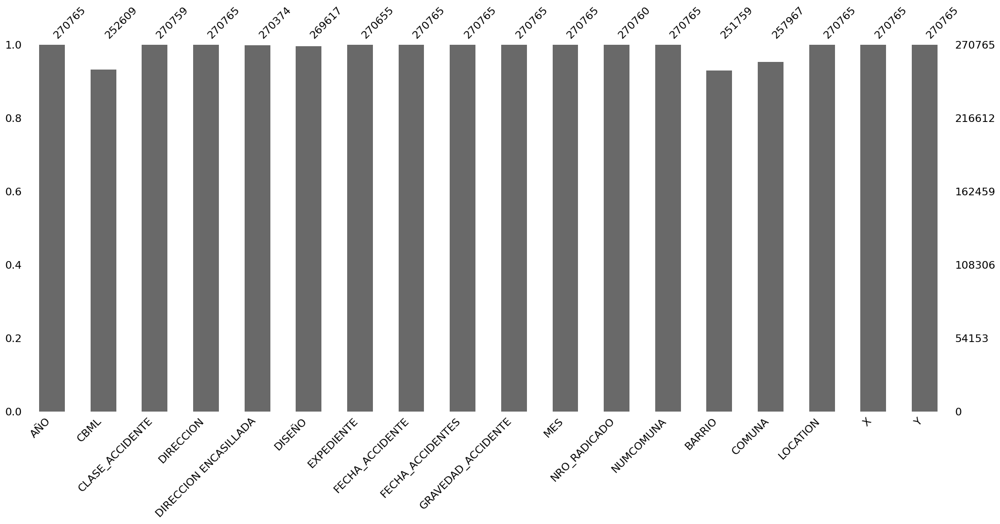

In [5]:
msno.bar(df)

Gráfico 1. Valores nulos.

En cada una de las características del gráfico 1, las líneas blancas indican la proporción de valores faltantes y las barras grises completitud de los datos, es decir entre más cerca esté la barra a 1 significa que esa variable tiene mayor cantidad de valores no nulos, lo cual implica que cuanto más corta es la barra, más valores nulos existen. Todas las columnas del dataset tienen más del 92% de los datos presentes, lo cual da indicio sobre la calidad de los datos presentados.

## Análisis exploratorio

### Año

Como los modelos predictivos se construirán con los datos de los años 2014, 2015, 2016, 2018 y se validarán con los años 2019 y 2020, se procede a realizar algunos ajuste sobre esta variable, tales como obtener una sola columna por año y así evitar redundancia de datos y eliminación de caracteres especiales.

<b> Valores iniciales en la columna año: </b>

In [6]:
df['AÑO'].unique()


array(['2015', '2014', '2016', '2017', '2018', '2019\\r', '2019', '2020',
       2020, 2015, 2014, 2016, 2017, 2018], dtype=object)

<b> Valores después de la modificación: </b>

In [7]:
df['AÑO'] = df['AÑO'].replace('2019\\r','2019').astype(str)
df['AÑO'].unique()

array(['2015', '2014', '2016', '2017', '2018', '2019', '2020'],
      dtype=object)

In [8]:
# Utils function
import association_metrics as am
import seaborn as sns

def cramer_corr(dataset):
    dataset = dataset.apply(
        lambda x: x.astype("category") if x.dtype == "O" else x
        )
    cramersv = am.CramersV(dataset) 
    sns.heatmap(cramersv.fit(), annot = True)

### Accidentes por año

A continuación se presenta el número de accidentes por cada año:

In [9]:
tabla = pd.crosstab(index=df['AÑO'], columns='Total')
tabla['Porcentaje'] = (tabla/tabla.sum()) * 100
tabla

col_0,Total,Porcentaje
AÑO,,
2014,22415,8.278396
2015,46172,17.052426
2016,47103,17.396266
2017,46205,17.064613
2018,43358,16.013148
2019,45795,16.913190
2020,19717,7.281960


[Text(0, 0, '22415'),
 Text(0, 0, '46172'),
 Text(0, 0, '47103'),
 Text(0, 0, '46205'),
 Text(0, 0, '43358'),
 Text(0, 0, '45795'),
 Text(0, 0, '19717')]

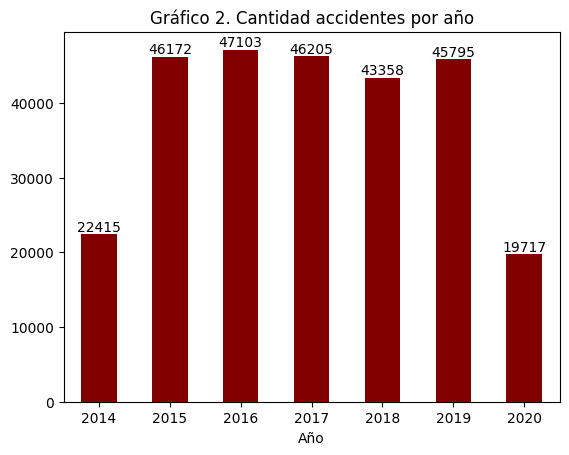

In [10]:
anio_count_values = df['AÑO'].value_counts().sort_index()
plot = anio_count_values.plot.bar(rot=0, color='maroon', title='Gráfico 2. Cantidad accidentes por año', xlabel= 'Año')
plot.bar_label(plot.containers[0])

A partide del gráfico 2 se evidencia que la tasa de accidentalidad más baja se registro en el año 2020 y las más alta en el 2016. El número de accidentes entre los años 2015 y 2019 fueron bastante similares, mientras que en los años 2014 y 2020 se presentan considerablemente, menos accidentes que en los demás años. Es decir que en del año 2014 al 2015 hubo un crecimiento considerable en la tasa de accidentabilidad (más del 50%), se mantuvo constante entre 2015 y 2019 aún cuando en el 2018 hubo una pequeña disminución, pero en la transición de 2019 a 2020 hubo un decremento de más del 50% (más o menos 20.000 accidentes menos que el año anterior).

### Clase de accidente

En esta columna existen 10 categorías de clases de accidentes: Atropello, Caída Ocupante,Caida Ocupante, Caída de Ocupante, Caida de Ocupante, Choque, Incendio, Otro, Volcamiento y nan. Pero como podremos notar solo deberían de existir 7, ya que las tres concernientes a caída ocupante debe ser sólo una, por lo que se lleva a cabo esta modificación.

<b>Valores iniciales: </b>

In [11]:
df['CLASE_ACCIDENTE'].unique()

array(['Caida Ocupante', 'Choque', 'Otro', 'Atropello', 'Volcamiento',
       'Caída de Ocupante', 'Caída Ocupante', 'Incendio', nan,
       'Caida de Ocupante'], dtype=object)

<b> Valores corregidos: </b>

In [12]:
df['CLASE_ACCIDENTE'] = df['CLASE_ACCIDENTE'].str.lower()
df['CLASE_ACCIDENTE'] = df['CLASE_ACCIDENTE'].replace('caida ocupante','caída ocupante').replace('caida de ocupante', 'caída ocupante').replace('caída de ocupante','caída ocupante')
df.CLASE_ACCIDENTE.unique()

array(['caída ocupante', 'choque', 'otro', 'atropello', 'volcamiento',
       'incendio', nan], dtype=object)

<b>Total de accidentes por clase </b>

In [13]:
tabla = pd.crosstab(index=df['CLASE_ACCIDENTE'], columns='Total')
tabla['Porcentaje'] = (tabla/tabla.sum()) * 100
tabla

col_0,Total,Porcentaje
CLASE_ACCIDENTE,,
atropello,25585,9.449363
caída ocupante,24157,8.921956
choque,180575,66.692151
incendio,35,0.012927
otro,30039,11.094368
volcamiento,10368,3.829236


A continuación, visualicemos la cantidad de accidentes según el tipo del mismo (clase) en el gráfico 3:

[Text(0, 0, '25585'),
 Text(0, 0, '24157'),
 Text(0, 0, '180575'),
 Text(0, 0, '35'),
 Text(0, 0, '30039'),
 Text(0, 0, '10368')]

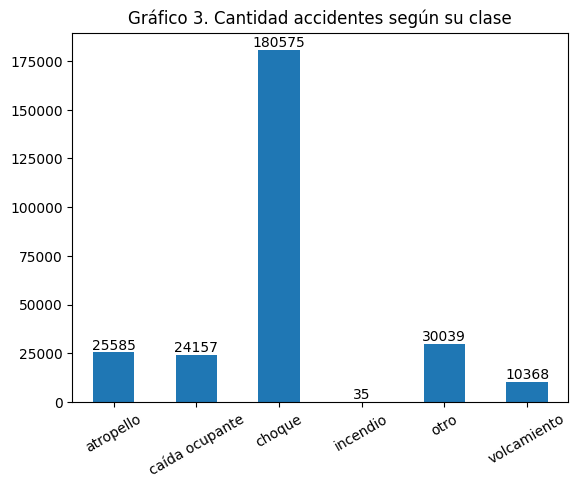

In [14]:
clase_count_values = df['CLASE_ACCIDENTE'].value_counts().sort_index()
plot = clase_count_values.plot.bar(rot=30, title='Gráfico 3. Cantidad accidentes según su clase')
# plot = clase_count_values.plot.bar(rot=0, title='Cantidad accidentes sgún su clase', width=0.3)
plot.bar_label(plot.containers[0])

A partir de la gráfica 3 se puede evidenciar que la causa más común de accidentalidad vehicular en el municipio de Medellín es por choque, aproximadamente el 85.678%, siendo la causa de incendio la más remota en ocurrencia(0.0166% aproximadamente). Se puede visualizar que los atropellos y caídas de ocupantes cuentan con una cifra similar, y que la categoría Otro supera los 30.000 accidentes.

### Diseño

<b> Valores iniciales: </b>

In [15]:
df.DISEÑO.unique()

array(['Tramo de via', 'Interseccion', 'Glorieta', 'Lote o Predio',
       'Paso a Nivel', 'Puente', 'Paso Elevado', 'Ciclo Ruta',
       'Paso Inferior', nan, 'Via peatonal', 'Pontón', 'Tunel',
       'Pont\\xF3n'], dtype=object)

En esta columna hay 14 categorías, una de ellas con carácteres especiales por la tilde en el valor pontón, en consecuencia se lleva a cabo esta modificación. Finalmente tenemos 13 categorías de lugares donde ocurrieron los accidentes.

<b> Valores corregidos: </b>

In [16]:
df['DISEÑO'] = df['DISEÑO'].replace('Pont\\xF3n','Pontón')
df.DISEÑO.unique()

array(['Tramo de via', 'Interseccion', 'Glorieta', 'Lote o Predio',
       'Paso a Nivel', 'Puente', 'Paso Elevado', 'Ciclo Ruta',
       'Paso Inferior', nan, 'Via peatonal', 'Pontón', 'Tunel'],
      dtype=object)

<b>Cantidad de accidentes por diseño de vía</b>

In [17]:
tabla = pd.crosstab(index=df['DISEÑO'], columns='Total')
tabla['Porcentaje'] = (tabla/tabla.sum()) * 100
tabla

col_0,Total,Porcentaje
DISEÑO,,
Ciclo Ruta,1040,0.385732
Glorieta,6756,2.505777
Interseccion,43935,16.295337
Lote o Predio,27104,10.052779
Paso Elevado,1399,0.518884
Paso Inferior,678,0.251468
Paso a Nivel,125,0.046362
Pontón,34,0.012610
Puente,1064,0.394634


[Text(0, 0, '1040'),
 Text(0, 0, '6756'),
 Text(0, 0, '43935'),
 Text(0, 0, '27104'),
 Text(0, 0, '1399'),
 Text(0, 0, '678'),
 Text(0, 0, '125'),
 Text(0, 0, '34'),
 Text(0, 0, '1064'),
 Text(0, 0, '187319'),
 Text(0, 0, '107'),
 Text(0, 0, '56')]

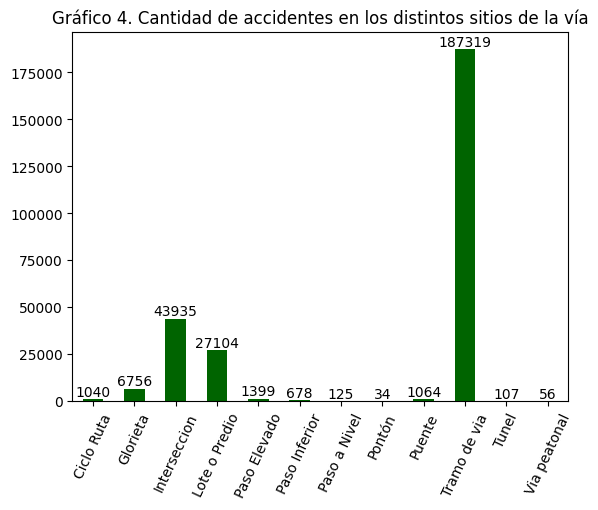

In [18]:
dis_count_values = df['DISEÑO'].value_counts().sort_index()
plot = dis_count_values.plot.bar(rot=65, color='DarkGreen', title='Gráfico 4. Cantidad de accidentes en los distintos sitios de la vía')
plot.bar_label(plot.containers[0])

Según el gráfico 4 y su respectiva tabla, más del 69 % de los accidentes ocurrieron en tramos de vía, seguido (en menor cantidad) por las intersecciones, lotes o predios y glorietas, los lugares de menor accidentalidad son los túneles, vías peatonales y pontones, apenas y suman el 0.073% del total, es decir que en estos lugares la accidentalidad es mínima, pero tiene sentido dado que en las vías peatonales y los pontones no deberían de haber vehículos y podríamos suponer que la condición de los túneles junto a las medidas que deben de seguir quienes los transitan (luces encendidas, velocidad reducida, señal restringida, entre otras) disminuye la accidentalidad.

### Gravedad accidente

<b> Valores iniciales: </b>

In [ ]:
df.GRAVEDAD_ACCIDENTE.unique()

array(['Con heridos', 'Solo daños', 'Con muertos', 'Solo da\\xF1os'],
      dtype=object)

Para el preprocesamiento de esta variable, se reemplazan los caracteres especiales de la "ñ" en el valor "Solo daños", para obtener así únicamente tres categorías: Con heridos, Solo daños, Con muertos.

<b> Valores corregidos: </b>

In [ ]:
df['GRAVEDAD_ACCIDENTE'] = df['GRAVEDAD_ACCIDENTE'].replace('Solo da\\xF1os','Solo daños')
df.GRAVEDAD_ACCIDENTE.unique()

array(['Con heridos', 'Solo daños', 'Con muertos'], dtype=object)

A continuación, veamos la cantidad de accidentes por nivel de gravedad del mismo:

[Text(0, 0, '150071'), Text(0, 0, '1489'), Text(0, 0, '119205')]

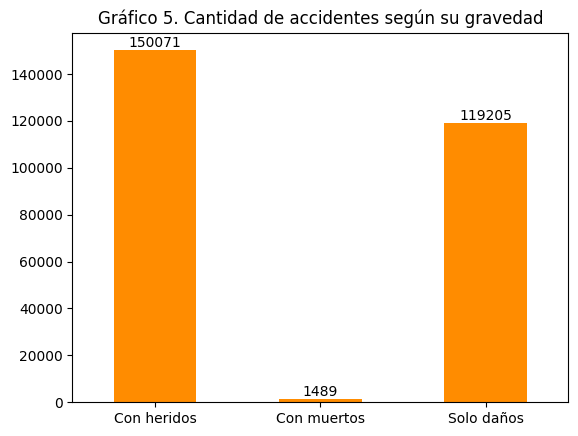

In [ ]:
GRAV_count_values = df.GRAVEDAD_ACCIDENTE.value_counts().sort_index()
plot = GRAV_count_values.plot.bar(rot=0, color='DarkOrange', title='Gráfico 5. Cantidad de accidentes según su gravedad')
plot.bar_label(plot.containers[0])

In [ ]:
tabla = pd.crosstab(index=df['GRAVEDAD_ACCIDENTE'], columns='Total')
tabla['Porcentaje'] = (tabla/tabla.sum()) * 100
tabla

col_0,Total,Porcentaje
GRAVEDAD_ACCIDENTE,,
Con heridos,150071,55.424815
Con muertos,1489,0.549923
Solo daños,119205,44.025262


Como se visualiza en el gráfico 5, la mayoría de casos de accidentes en el municipio de Medellín, la gravedad de la eventualidad resulta con heridos o daños físicos, menos del 0.55% de las veces  el accidente se concluye con muertos.

### Mes

In [ ]:
df.MES.describe()

count    270765.000000
mean          6.683630
std           3.414502
min           1.000000
25%           4.000000
50%           7.000000
75%          10.000000
max          12.000000
Name: MES, dtype: float64

[Text(0, 0, '42368'),
 Text(0, 0, '21524'),
 Text(0, 0, '19317'),
 Text(0, 0, '21274'),
 Text(0, 0, '20351'),
 Text(0, 0, '25064'),
 Text(0, 0, '27058'),
 Text(0, 0, '24172'),
 Text(0, 0, '23991'),
 Text(0, 0, '45646')]

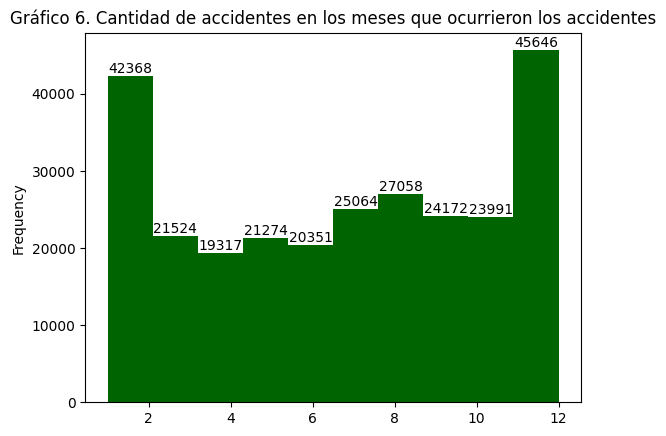

In [ ]:
# df.MES.plot.hist( title = 'Mes en el que ocurrieron los accidentes', )
plot = df.MES.plot.hist(rot=0, color='DarkGreen', title='Gráfico 6. Cantidad de accidentes en los meses que ocurrieron los accidentes')
plot.bar_label(plot.containers[0])

Siendo el mes 1, enero, y el mes 12, diciembre representados en el gráfico 6, los meses del año en los que más ocurren incidentes viales evidentemente fue durante diciembre y enero superando las 42.000 eventualidades en cada mes, es decir que el final e inicio del año se concentra la mayor tasa de accidentalidad registrada, mientras que en los meses (de febrero a junio) se registraron accidentes entre 19.000 y 20.300 aproximadamente, y hay un incremento después de la mitad del año hasta noviembre.

### Número de comuna

In [ ]:
df.NUMCOMUNA.describe()

count     270765
unique        35
top           10
freq       52147
Name: NUMCOMUNA, dtype: object

La columna contiene 35 valores únicos, pero como fueron descritos anteriormente, sabemos que el área metropolitana del municipio de Medellín esta conformado por 16 comunas y 5 corregimientos, por lo que podemos intuir que hay errores en el ingreso de estos.


<b> Valores iniciales: </b>

In [ ]:
df.NUMCOMUNA.unique()

array(['10', '02', '01', '15', '14', '11', '07', '06', '04', '09', '05',
       '80', 'Sin Inf', '13', '08', '16', '03', '12', '70', '60', '90',
       'In', 'SN', '0', '50', 'AU', '5', '7', '9', '4', '3', '1', '2',
       '8', '6'], dtype=object)

In [ ]:
standard_comuna = {
    '1':'01',
    '2':'02',
    '3':'03',
    '4':'04',
    '5':'05',
    '6':'06',
    '7':'07',
    '8':'08',
    '9':'09',

} #I choose this values as the incorrect values taking in mind the text and the beginning of the notebook.

correct_values = set(['01', '02','03', '04', '05', 
                '06', '07', '08', '09', '10',
                '11', '12','13', '14', '15',
                '16', '50', '60', '70', '80', '90'])

In [ ]:
def clean_columna(columna):
    if columna in correct_values:
        return columna
    elif columna in standard_comuna:
        return standard_comuna[columna]
    return None

Se estandarizan los valores de NUMCOMUNA, unificando la nomenclatura a dos digitos ya que se encuentran tanto valores de '01' y '1' por ejemplo. Además se llevan a NA aquellos valores que no tienen sentido o interpretacion dentro de la columna.

In [ ]:
df['NUMCOMUNA'] = df.apply(lambda row: clean_columna(row['NUMCOMUNA']), axis = 1 )

<b> Valores corregidos: </b>

In [96]:
df.NUMCOMUNA.unique()

['10', '02', '01', '15', '14', ..., '12', '70', '60', '90', '50']
Length: 22
Categories (21, object): ['01', '02', '03', '04', ..., '60', '70', '80', '90']

### Comuna

In [ ]:
from unicodedata import normalize

<b> Valores iniciales: </b>

In [ ]:
df.COMUNA.unique()

array(['La Candelaria', 'Santa Cruz', 'Popular', 'Guayabal', 'El Poblado',
       'Laureles Estadio', 'Robledo', 'Doce de Octubre', 'Aranjuez',
       'Buenos Aires', 'Castilla',
       'Corregimiento de San Antonio de Prado', nan, 'San Javier',
       'Villa Hermosa', 'Belén', 'Manrique', 'La América',
       'Corregimiento de Altavista', 'Corregimiento de San Cristóbal',
       'Corregimiento de Santa Elena', 'In', 'SN', 'No Georef',
       'Corregimiento de San Sebastián de Palmitas', 'Bel\\xE9n',
       'La Am\\xE9rica', 'Corregimiento de San Crist\\xF3bal',
       'Corregimiento de San Sebasti\\xE1n de Palmitas', 'Sin Inf', '0',
       'AU'], dtype=object)

In [ ]:
change_comuna = {
    'La Am\\xE9rica':'La America',
    'La AmÃ©rica'  :'La America',
    'BelÃ©n'   : 'Belen',
    'Bel\\xE9n': 'Belen',
    'Corregimiento de San CristÃ³bal'  : 'Corregimiento de San Cristobal',
    'Corregimiento de San Crist\\xF3bal': 'Corregimiento de San Cristobal',
    'Corregimiento de San SebastiÃ¡n de Palmitas'   : 'Corregimiento de San Sebastian de Palmitas',
    'Corregimiento de San Sebasti\\xE1n de Palmitas': 'Corregimiento de San Sebastian de Palmitas',

}

correct_comuna = set(
    (
        'La Candelaria','Santa Cruz', 'Popular', 'Guayabal',
        'El Poblado', 'Laureles Estadio', 'Robledo', 'Doce de Octubre',
        'Aranjuez', 'Buenos Aires', 'Castilla', 'Corregimiento de San Antonio de Prado',
        'San Javier', 'Villa Hermosa', 'Belen', 'Manrique', 'La America',
        'Corregimiento de Altavista', 'Corregimiento de Santa Elena',
        'Corregimiento de San Cristobal', 'Corregimiento de San Sebastian de Palmitas',
    )
)


In [ ]:
def clean_comuna(value):
    if value in correct_comuna:
        return value
    if value in change_comuna:
        return change_comuna[value]
    return None

In [ ]:
df['COMUNA'] = df.apply(lambda row: clean_comuna(row['COMUNA']), axis = 1 )

<b> Valores corregidos: </b>

In [35]:
df.COMUNA.unique()

array(['La Candelaria', 'Santa Cruz', 'Popular', 'Guayabal', 'El Poblado',
       'Laureles Estadio', 'Robledo', 'Doce de Octubre', 'Aranjuez',
       'Buenos Aires', 'Castilla',
       'Corregimiento de San Antonio de Prado', None, 'San Javier',
       'Villa Hermosa', 'Manrique', 'Corregimiento de Altavista',
       'Corregimiento de Santa Elena', 'Belen', 'La America',
       'Corregimiento de San Cristobal',
       'Corregimiento de San Sebastian de Palmitas'], dtype=object)

In [ ]:
#Diccionario NUMCOMUNA y COMUNA
name_comuna = {
    '01': 'Popular',
    '02': 'Santa Cruz',
    '03': 'Manrique',
    '04': 'Aranjuez',
    '05': 'Castilla',
    '06': 'Doce de Octubre',
    '07': 'Robledo',
    '08': 'Villa Hermosa',
    '09': 'Buenos Aires',
    '10': 'La Candelaria',
    '11': 'Laureles Estadio',
    '12': 'La America',
    '13': 'San Javier' ,
    '14': 'El Poblado',
    '15': 'Guayabal',
    '16': 'Belen',
    '50': 'Corregimiento de San Sebastian de Palmitas',
    '60': 'Corregimiento de San Cristobal',
    '70': 'Corregimiento de Altavista',
    '80': 'Corregimiento de San Antonio de Prado',
    '90': 'Corregimiento de Santa Elena',

}

### Fechas accidentes

Debido a errores de ingreso en la fecha, hemos decidido subsanarlos creando a partir de  FECHA_ACCIDENTE dos nuevas secciones: DIA_ACCIDENTE y HORA_ACCIDENTE.

In [ ]:
#La fecha no se encuentra en America/Bogotá, esto se puede saber graficando FECHA_ACCIDENTE
df.FECHA_ACCIDENTES  = pd.to_datetime(df.FECHA_ACCIDENTES, infer_datetime_format=True).dt.tz_convert("America/Bogota")
df.FECHA_ACCIDENTE = pd.to_datetime(df.FECHA_ACCIDENTE.str.replace("Sin Inf", ""), infer_datetime_format=True)

In [119]:
def plot_date_accidente(df, column,title='',xlabel=''):
    df.groupby([column, df.CLASE_ACCIDENTE] ).size().unstack().plot(kind='bar',stacked = True, rot=0, title=title, xlabel=xlabel, ylabel='Cantidad accidentes')    

def plot_date_gravedad(df, column,title='',xlabel=''):
    df.groupby([column, df.GRAVEDAD_ACCIDENTE] ).size().unstack().plot(kind='bar',stacked = True, rot=0,title= title, xlabel=xlabel, ylabel='Cantidad accidentes')    

### Accidentalidad por años

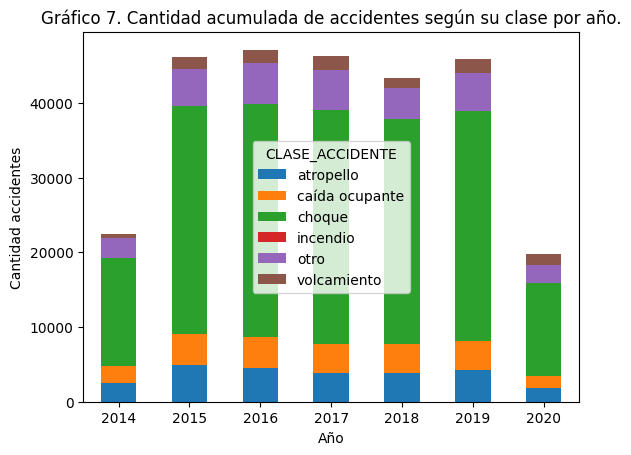

In [121]:
df.pipe(plot_date_accidente, column=df.FECHA_ACCIDENTE.dt.year, title='Gráfico 7. Cantidad acumulada de accidentes según su clase por año.', xlabel='Año')

Como se visualiza en el gráfico 7, la proporción de clase de accidente se conserva durante los años, es decir en cada franja temporal los choques son muy frecuentes, de igual manera los atropellos y caídas de ocupantes ocurren en similar cantidad y solo en 2018 ocurrieron incendios, sin embargo, fueron muy pocos.

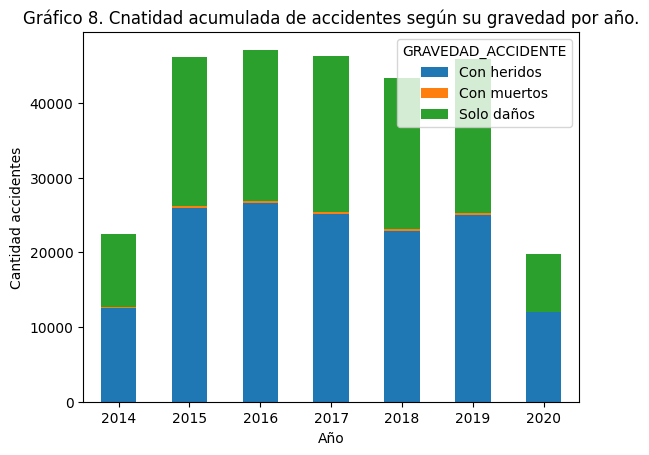

In [124]:
df.pipe(plot_date_gravedad, column=df.FECHA_ACCIDENTES.dt.year, title='Gráfico 8. Cnatidad acumulada de accidentes según su gravedad por año.', xlabel='Año')

En todos los años el porcentaje de la gravedad de accidente vehicular se concreta con heridos, en menor cantidad con sólo daños y, aunque muy mínimo, se reportaron accidentes con decesos en todas las franjas temporales, según el gráfico 8. 

### Accidentalidad por meses del año

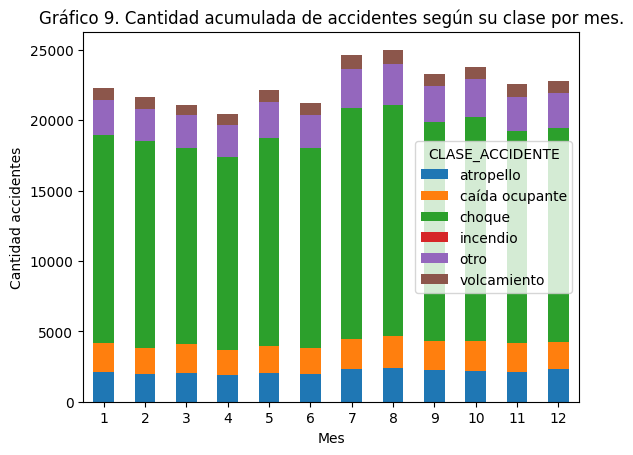

In [125]:
df.pipe(plot_date_accidente, column=df.FECHA_ACCIDENTE.dt.month, title = 'Gráfico 9. Cantidad acumulada de accidentes según su clase por mes.', xlabel='Mes')

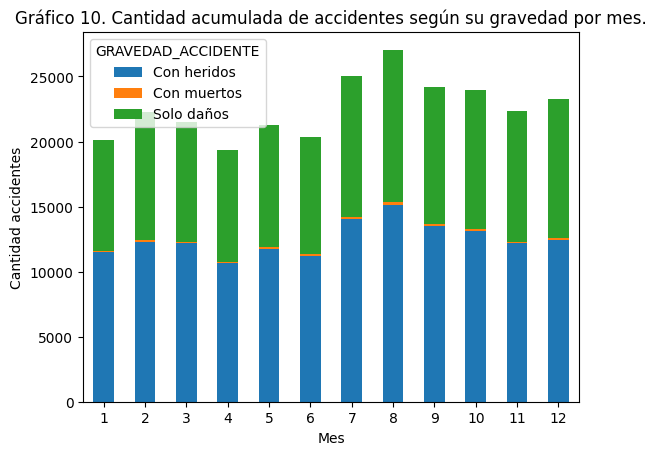

In [ ]:
df.pipe(plot_date_gravedad, column=df.FECHA_ACCIDENTES.dt.month, title='Gráfico 10. Cantidad acumulada de accidentes según su gravedad por mes.', xlabel='Mes')

### Accidentalidad por días del mes

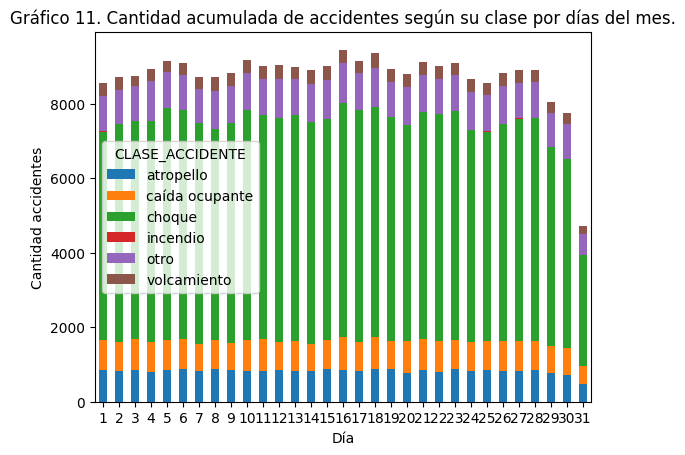

In [ ]:
df.pipe(plot_date_accidente, column=df.FECHA_ACCIDENTES.dt.day,title='Gráfico 11. Cantidad acumulada de accidentes según su clase por días del mes.',xlabel='Día')

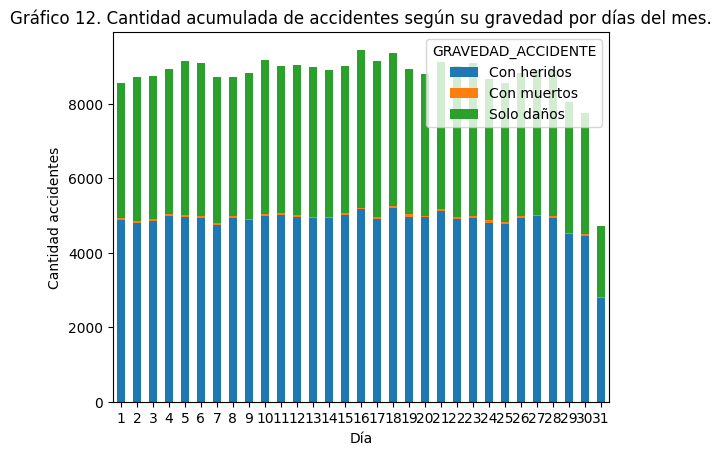

In [131]:
df.pipe(plot_date_gravedad, column=df.FECHA_ACCIDENTES.dt.day,title='Gráfico 12. Cantidad acumulada de accidentes según su gravedad por días del mes.',xlabel='Día')

A partir de los gráficos 11 y 12 se puede notar el dia 31 tiene cifras significativamente diferentes, lo cual llama atención dado que siete meses (Enero, marzo, mayo, julio, agosto, octubre y diciembre) tienen 31 días calendarios, entonces se esperaría que hubieran más registros en comparación al 30 de cada mes ya que solo 4 meses finalizan con este dia, (abril, junio, septiembre y noviembre), pero esto no sucede. El día con mayor frecuencia de accidentes es el 16; también se nota incrementos en los días 4-5, 10-12, 18, 21-23. En general siempre hay mas choques que otra clase de accidente y la gravedad está marcada principalmente por "con heridos", seguida en menor cantidad por "solo daños", y aun cuando la cidras de muertes es pequeña, pasan todos los días del mes.

### Accidentalidad por días de la semana

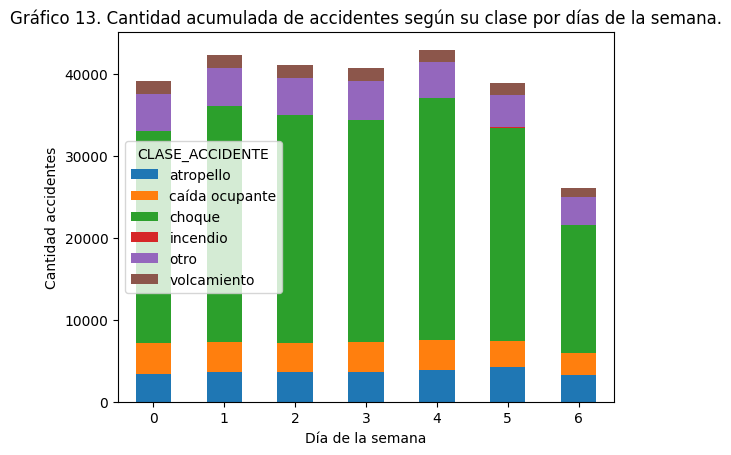

In [ ]:
df.pipe(plot_date_accidente, column=df.FECHA_ACCIDENTES.dt.dayofweek, title='Gráfico 13. Cantidad acumulada de accidentes según su clase por días de la semana.',xlabel='Día de la semana')

Gráfico 13. Cantidad acumulada de accidentes según su clase por días de la semana.

Considerando que 0: Lunes, 1: Martes, 2: Miércoles, 3: Jueves, 4: Viernes, 5: Sabado y 6: Domingo en el gráfico 13. Los viernes son los días con más reportes de accidentes, el domingo es donde menos ocurren. Los días martes y jueves tienen un comportamiento similar.

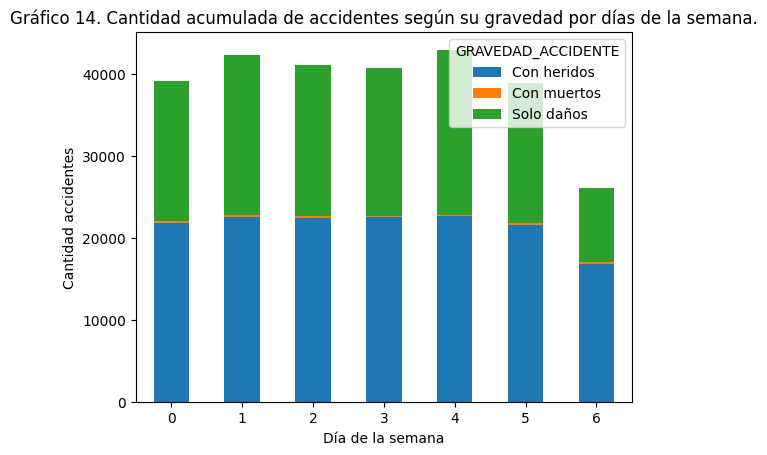

In [143]:
df.pipe(plot_date_gravedad, column=df.FECHA_ACCIDENTES.dt.dayofweek,title='Gráfico 14. Cantidad acumulada de accidentes según su gravedad por días de la semana.',xlabel='Día de la semana')

Gráfico 14. Cantidad acumulada de accidentes según su gravedad por días de la semana.

En el gráfico 14, independientemente del día, la gravedad del accidente con heridos supera a la clasificación "solo daños", y como hemos concluido anteriormente se sufrieron decesos pero éstos son mínimos y con cifras semejante en cada día de la semana, excepto los lunes y martes donde hay una pequeña deducción sobre esta tasa. Podemos generalizar que después del viernes la tasa de accidentes vehicuares disminuye.

### Accidentalidad por horas

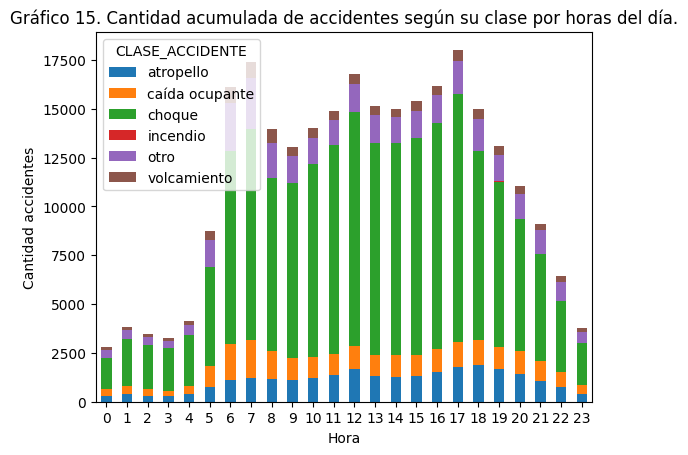

In [147]:
df.pipe(plot_date_accidente, column=df.FECHA_ACCIDENTE.dt.hour,title='Gráfico 15. Cantidad acumulada de accidentes según su clase por horas del día.',xlabel='Hora')

Gráfico 15. Cantidad acumulada de accidentes según su clase por horas del día.

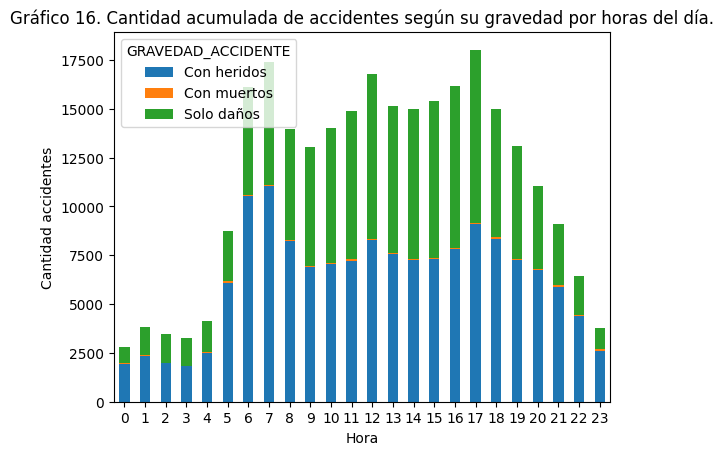

In [169]:
df.pipe(plot_date_gravedad, column=df.FECHA_ACCIDENTE.dt.hour,title='Gráfico 16. Cantidad acumulada de accidentes según su gravedad por horas del día.',xlabel='Hora')

Gráfico 16. Cantidad acumulada de accidentes según su gravedad por horas del día.

Tomando como franja temporal 1 hora, el sistema horario de 24 horas está indicado por la cantidad de horas contadas a partir de la medianoche, de 0 a 23, respectivamente. Del gráfico 16 podemos decir que en el área metropolitana de Medellín, en las primeras horas del amanecer es donde menos incidentes ocurren (entre las 12 am y las 4 am), hay un aumento significativo a las 5 am donde paralelamente inicia la hora pico (mayor congestión y movimiento vehicular) y aún más 1 hora después, en este intervalo de tiempo aumentan los accidentes vehiculares hasta las 8, que por lo general es donde empieza a bajar la congestión. Entonces podemos decir que en las horas pico se ocasionan más accidentes. Este fenómeno también es  apreciado al medio dia y entre las 4 y 5 de la tarde. Al finalizar las 5 pm se observa una constante disminución de percances vehiculares hasta las 12 del otro día.


### Accidentalidad por semanas del año

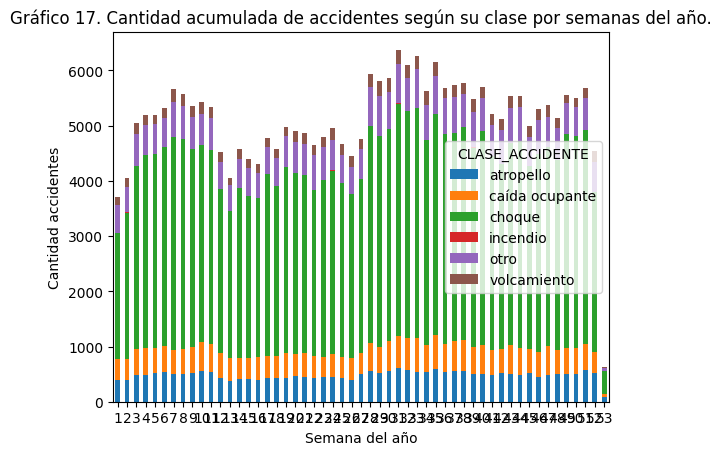

In [172]:
df.pipe(plot_date_accidente, column=df.FECHA_ACCIDENTES.dt.week, title='Gráfico 17. Cantidad acumulada de accidentes según su clase por semanas del año.',xlabel='Semana del año')

Gráfico 17. Cantidad acumulada de accidentes según su clase por semanas del año.

En el año hay aproximadamente 53 semanas, lo cual implica que por lo general  la última no tiene 7 días o puede llegar a no existir, por las razones anteriormente mencionadas es coherente que en la semana 53 hayan pocos reportes de accidentes en comparación a las otras, tal como se evidencia en el gráfico 17. Como podemos observar, las dos primeras semanas del año possen menores cifras de accidentes vehiculares, en promedio de la semana 28 a 36 es donde se presenta mayor tasa de accidentalidad. Si dividimos el año en dos -de la semana 1 a la 25 y de la 26 a la 52-, observamos un fenómeno muy curioso y parecido: observamos en las dos primeras semanas un incremento pero de la tercera a un aumento significativo, cuando llega al pico máximo unas 4 o 5 semanas después los accidentes merman, y luego se vuelven a incrementar. Así mismo ocurre en la segunda parte del año, pero a mayor escala.

In [50]:
df["holiday"] = df.FECHA_ACCIDENTES.apply(lambda x: str(x) in co_holidays)

### Accidentes en días festivos

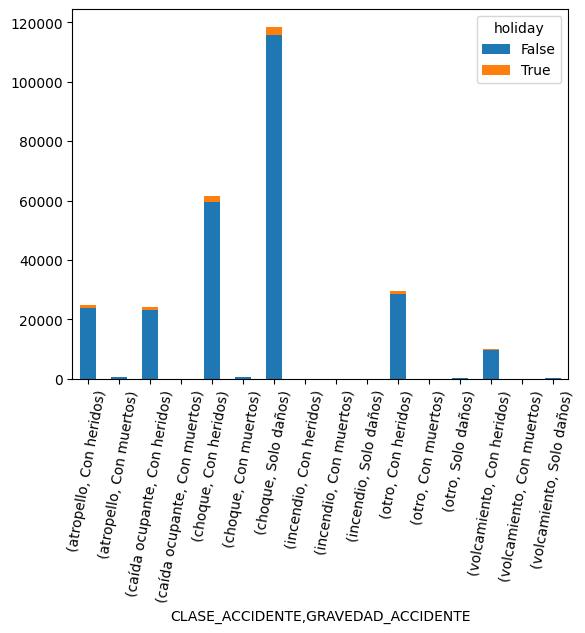

In [51]:
df_grouped_holiday = df.groupby([df.CLASE_ACCIDENTE,df.GRAVEDAD_ACCIDENTE,df.holiday] ).size().unstack().plot(kind='bar',stacked = True, rot=80)

Gráfico 18. Cantidad acumulada de accidentes en los días festivosa según su clase y gravedad.

Como podemos visualizar en el gráfico 18, en los días festivos la ocurrencia de accidentes es mínima, entonces podemos decir que en estos días los accidentes vehiculares son inusuales.  

### Barrio

Esta columna contiene algunos errores en los cuales se reemplaza la tilde por carácteres especiales. Por ejemplo, la é es reemplazada por '\\xE9', por lo cual se debe hacer una modificación a estos barrios. Además, se pasa todo a minúscula y se eliminan las tildes para unificar la mayor cantidad de barrios posibles.

In [52]:
regex_to_replace = [
    (r'\\xE9' , 'e'),
    (r'\\xF3' , 'o'),
    (r'\\xED' , 'i'),
    (r'\\xFA' , 'u'),
    (r'\\xC1' , 'a'),
    (r'\\xE1' , 'a'),
    (r'\\xF1' , 'ñ'),
    (r'\\xE9|É|é' , 'e'),
    (r'\\xF3|Ó|ó' , 'o'),
    (r'\\xED|Í|í' , 'i'),
    (r'\\xFA|Ú|ú' , 'u'),
    (r'\\xC1|\\xE1|Á|á' , 'a'),
    (r'\xF1' , 'ñ'),
    (r'^sub\w*' , ''),
    (r'barrio de' , ''),
    (r'no[.].|[1-9]',''),
    (r'^e?l[ao]?.? ', ''),
 ] 

In [53]:
def containsIncorrect(palabra):
    for old, new in regex_to_replace:
        palabra = re.sub(old, new, palabra, flags=re.IGNORECASE)
    return palabra

### Nuncomuna

In [54]:
import numpy as np
df.NUMCOMUNA = pd.Categorical(df.NUMCOMUNA)
df.NUMCOMUNA.describe()

count     250638
unique        21
top           10
freq       52147
Name: NUMCOMUNA, dtype: object

<AxesSubplot: xlabel='NUMCOMUNA'>

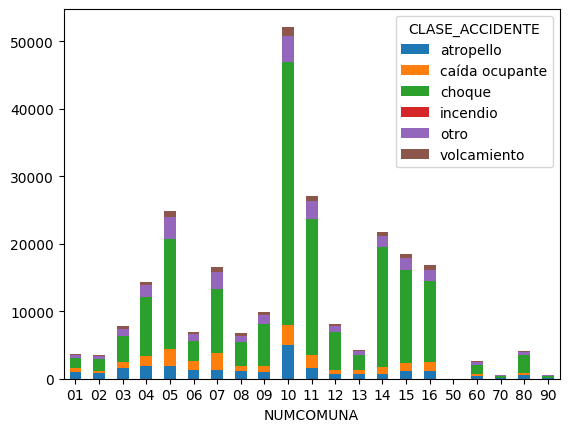

In [55]:
df.groupby([ df.NUMCOMUNA,df.CLASE_ACCIDENTE] ).size().unstack().plot(kind='bar',stacked = True, rot=0)

Gráfico 19. Cantidad acumulada de accidentes según su clase por número de comuna.

Como podemos observar en el gráfico 19, la comuna con mayor accidentalidad es La Candelaria, la cual abarca gran parte de la zona Centro - Oriental con características mismas del centro metropolitano de la ciudad, lo cual implica que gran cantidad de vías principales, y mayormente transcurridas estén en esta zona como resultado de las circunstancias propias de las relaciones urbanas que allí se generan (económicas, financieras, culturales y sociales).

La comuna 5: Castilla, ubicada en la zona noroccidental, limita por el norte con el municipio de Bello, en esta comuna se suele visualizar la ausencia de buenos operadores de tránsito (falta de semáforos, conductores de motos sin casco, vías en malas condiciones, señalización precaria) pero es una zona muy comercial (popularmente), mayoritariamente son negocios pequeños de todo tipo.

Las comunas 11:Laureles - Estadio - zona  centro-occidental , 14:Poblado - zona sur-oriental, 15: Guayabal - zona suroccidente y 16: Belén- zona suroccidental, concentran el sector empresarial y sus principales oficinas, lo cual implica un movimiento diario y en multitud de miles de trabajadores. Además estas zonas son consideradas altamente comerciales en sector de restaurantes, bares, discotecas, entre otros lugares de esparcimiento y diversión (Industriales, la 70, la 33, Lleras, Provenza, barrio Colombia, zonas rosas, centros comerciales) con mayor actividad en la tarde y noche. 

<AxesSubplot: xlabel='NUMCOMUNA'>

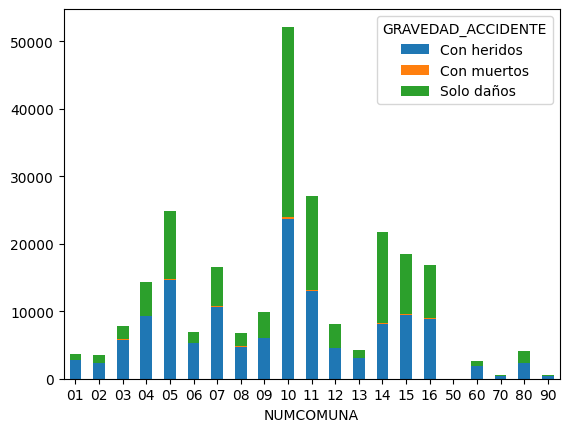

In [56]:
df.groupby([ df.NUMCOMUNA,df.GRAVEDAD_ACCIDENTE] ).size().unstack().plot(kind='bar',stacked = True, rot=0)

Gráfico 20. Cantidad acumulada de accidentes según su gravedad por número de comuna.

Entonces podemos considerar a partir de las gráficas 19 y 20 que las comunas con mayor actividad y dinamismo implican mayor tránsito y congestión vehicular, por lo tanto existen mayor cantidad de accidentes, ya sea por las condiciones estructurales de las calles y avenidas, el traslado simultáne de las multitudes, el estado de los conductores, pasajeros y transeúntes, el acatamiento de normas de tránsito, la cultura ciudadana, entre otros, factores que cambian y difieren entre comunas de la ciudad de Medellín. Independientemente de la comuna o corregimiento los choques son los mayores causales de accidentes vehiculares y respecto a la gravedad del accidente estos en mayoría terminan reportando heridos y en menor proporción solo daños, aunque en algunas comunas esto difiere (comunas 10, 11 y 14).

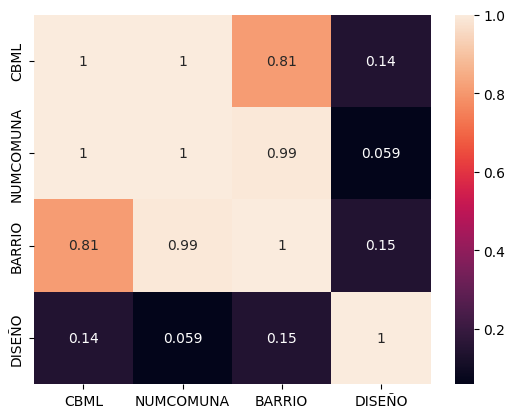

In [57]:
from matplotlib import pyplot as plt
from dython.nominal import associations


columns = ["CBML", "NUMCOMUNA","BARRIO", "DISEÑO"]
dataset = df[columns]
cramer_corr(dataset)

Gráfico 21. Matriz de correlación de diseño (sitio de la vía donde ocurrió el accidente), Barrio, Número de comuna y CBML (código catastral).

### Diseño y clase de accidente

<AxesSubplot: xlabel='DISEÑO'>

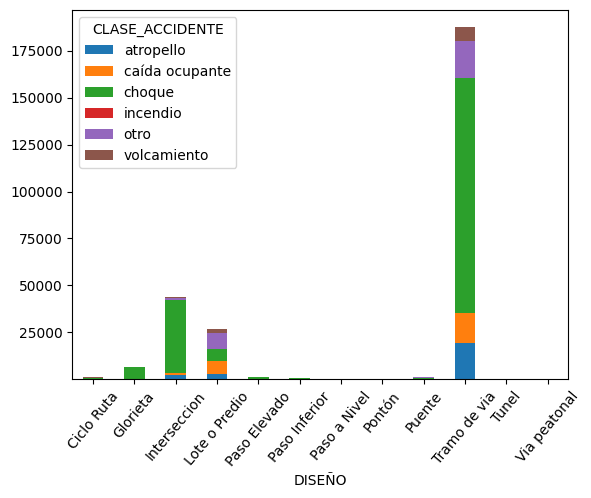

In [58]:
df.groupby([ df.DISEÑO,df.CLASE_ACCIDENTE] ).size().unstack().plot(kind='bar',stacked = True, rot=50)

Gráfico 22. Cantidad acumulada de accidentes según su clase por diseño vial.

Del gráfico 22 se puede observar que la cantidad de choques predominan en cada sitio de la vía donde ocurrieron los accidente. En las glorietas no es muy frecuente las eventualidades vehiculares, se han reportado choques, muy pocos volcamientos y caídas de ocupantes, dadas sus condiciones estructurales es lógico que no existan atropellos dado la restricción de transeúntes. En las intersecciones viales donde se cruzan dos o más caminos, dado las distintas trayectorias y prioridad de paso es evidente que más del 90% de los accidentes se generarán  por choques y ocasionalmente suceden atropellos, caídas de ocupantes, volcamientos, entre otros. En los lotes o predios existen cifras considerablemente iguales para los accidentes calificados como choques, caída de ocupante y otro y muy poco frecuentes los volcamientos y atropellos.

En los diseños viales (sitio donde ocurrió el accidente) que anteriormente no se han mencionado, es muy poco frecuente la ocurrencia de accidentes, y si los hay lo mas seguro es que sean consecuencia de un choque.

<AxesSubplot: xlabel='NUMCOMUNA'>

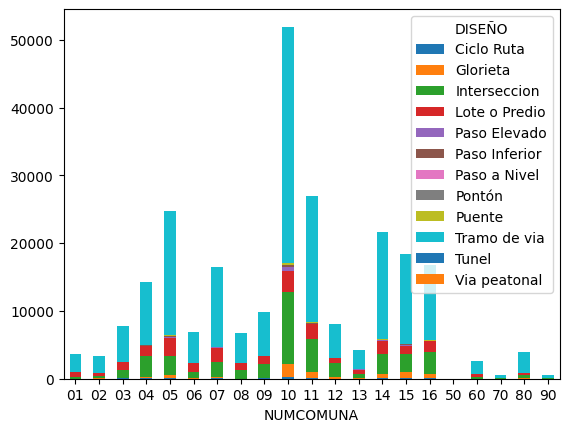

In [59]:
df.groupby([ df.NUMCOMUNA, df.DISEÑO] ).size().unstack().plot(kind='bar',stacked = True, rot=0)

Gráfico 23. Cantidad acumulada de accidentes según el diseño vial por número de comuna.

Según el gráfico 23, se puede observar que en todas las comunas los accidentes predominan en los tramos de vía, seguido por las intersecciones, por lo que son estos diseños viales los que pueden ser considerados más peligrosos por la ciudadanía.

### Localización

Teniendo la ubicación en latitud y longitud, trabajamos con las dos variables para localizarlas en el mapa del municipio de Medellín. Para lograrlo primero se hace un tratamiento sobre las columnas en cuestión, y volverlas variables cuantitativas. 

In [60]:
df.LOCATION = df.LOCATION.str.replace("[","").str.replace("]","").str.split(",")

In [61]:
df["longitud"] = df.LOCATION.apply(lambda x: x[0]).astype(float)
df["latitud"] = df.LOCATION.apply(lambda x: x[1]).astype(float)

### Identificación de valores atípicos (outliers)

<AxesSubplot: >

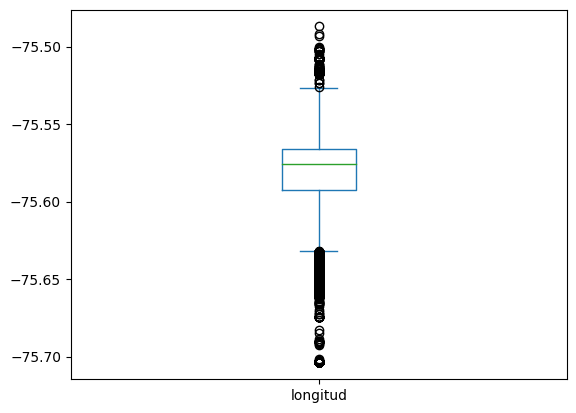

In [62]:
df["longitud"].plot.box()

Gráfico 24. Valores atípicos en la variable longitud.

<AxesSubplot: >

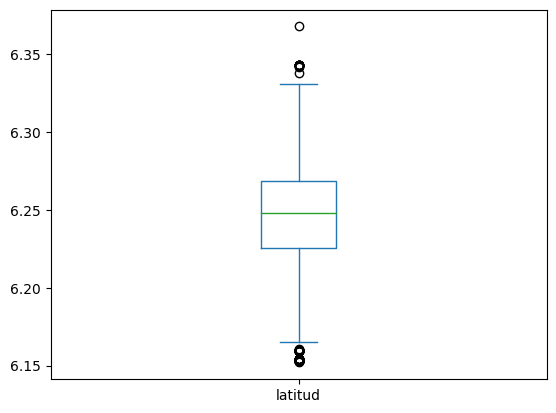

In [63]:
df["latitud"].plot.box()

Gráfico 25. Valores atípicos en la variable latitud.

En la variable "longitud" existen bastantes observaciones atípicas, mientras que en "latitud" sólo se presentan algunos. 

Bajo el  sistema de coordenadas MAGNA Medellín Local con X: Coordenada X en metros del accidente y Y: Coordenada Y en metros del accidente, se observa simetría en los valores atípicos, tal como se muestran a continuación en la gráfica 26 y 27:

<AxesSubplot: title={'center': 'boxplot'}>

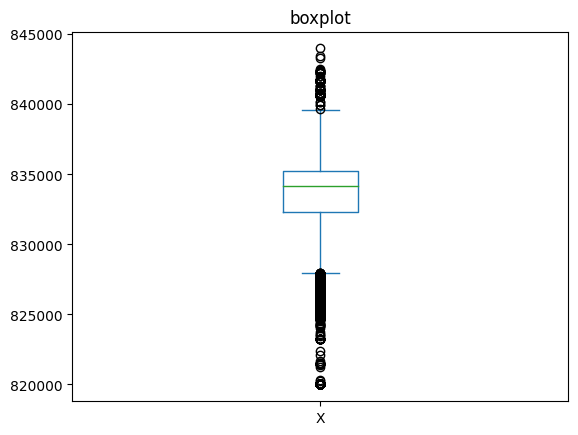

In [64]:
df["X"].plot(kind='box', title='boxplot')

Gráfico 26. Valores atípicos en la coordenada X.

<AxesSubplot: title={'center': 'boxplot'}>

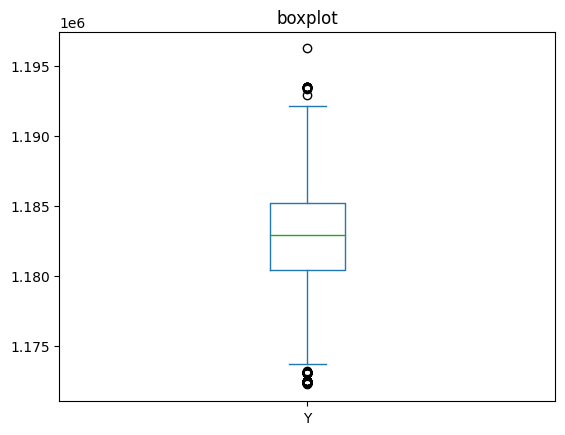

In [65]:
df["Y"].plot(kind='box', title='boxplot')

Gráfico 27. Valores atípicos en la coordenada Y.

Estas observaciones atípicas se registraron en las siguientes comunas y corregimientos:

In [66]:
df[df['X'] > df['X'].quantile(0.99)].COMUNA.value_counts()

Villa Hermosa                   1172
Buenos Aires                     619
Popular                          306
Corregimiento de Santa Elena     253
Manrique                         212
Name: COMUNA, dtype: int64

In [67]:
df[df['X'] <= df['X'].quantile(0.01)].COMUNA.value_counts()

El Poblado                               48
Castilla                                 42
Guayabal                                 36
La Candelaria                            16
Aranjuez                                 12
Laureles Estadio                         11
Corregimiento de San Antonio de Prado     9
Corregimiento de Santa Elena              4
Robledo                                   4
Corregimiento de Altavista                3
Buenos Aires                              2
Popular                                   1
Name: COMUNA, dtype: int64

In [68]:
df[df['Y'] > df['Y'].quantile(0.99)].COMUNA.value_counts()

Castilla                                      2057
Doce de Octubre                                610
Santa Cruz                                      23
Corregimiento de San Sebastian de Palmitas       2
Name: COMUNA, dtype: int64

In [69]:
df[df['Y'] <= df['Y'].quantile(0.01)].COMUNA.value_counts()

Corregimiento de San Antonio de Prado    2560
El Poblado                                 25
Robledo                                     4
Corregimiento de Santa Elena                3
Name: COMUNA, dtype: int64

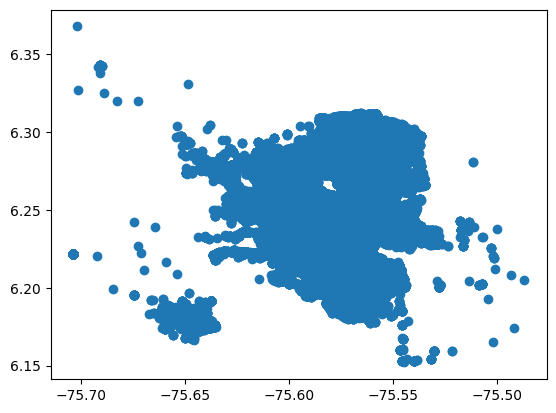

In [70]:
import matplotlib.pyplot as plt
plt.scatter(x=df['longitud'], y=df['latitud'])
plt.show()

Gráfico 28. Latitud y longitud.

In [71]:
import geopandas as gpd
from folium import Choropleth
from folium.plugins import HeatMap

In [72]:

data_geo = gpd.read_file("https://www.medellin.gov.co/mapas/rest/services/ServiciosPlaneacion/POT48_Base/MapServer/3/query?where=1%3D1&outFields=*&outSR=4326&f=json")

In [73]:
data_geo['CODIGO'].unique()

array(['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11',
       '12', '13', '14', '16', '50', '60', '70', '90', 'SN02', '80',
       'SN01', '15'], dtype=object)

## Nivel de accidentalidad diferenciado por comunas y corregimientos

Con el fin de realizar un Mapa interactivo de accidentalidad por comuna, se carga una bd con los datos de localización de las comunas de Medellin

In [74]:
data_geo.head()

,OBJECTID,CODIGO,NOMBRE,IDENTIFICACION,LIMITEMUNICIPIOID,SUBTIPO_COMUNACORREGIMIENTO,LINK_DOCUMENTO,SHAPE.AREA,SHAPE.LEN,geometry
0,344,01,Popular,Comuna 1,001,1,None,3.098286e+06,9604.982975,"POLYGON ((-75.54803 6.30436, -75.54795 6.30431..."
1,345,02,Santa Cruz,Comuna 2,001,1,None,2.195872e+06,8597.709005,"POLYGON ((-75.55703 6.31007, -75.55699 6.31003..."
2,346,03,Manrique,Comuna 3,001,1,None,5.096745e+06,12078.235158,"POLYGON ((-75.54252 6.28632, -75.54252 6.28632..."
3,347,04,Aranjuez,Comuna 4,001,1,None,4.883730e+06,9643.087768,"POLYGON ((-75.56229 6.29126, -75.56221 6.29125..."
4,348,05,Castilla,Comuna 5,001,1,None,6.064362e+06,16098.607962,"POLYGON ((-75.56566 6.31261, -75.56559 6.31259..."


In [75]:
comuna_count_values = df['NUMCOMUNA'].value_counts().sort_index().to_frame()
sn02_fila = pd.Series(data={'NUMCOMUNA':0}, name='SN02')
sn01_fila = pd.Series(data={'NUMCOMUNA':0}, name='SN01')
comu = comuna_count_values.append(sn02_fila, ignore_index=False)
comu = comu.append(sn01_fila, ignore_index=False)
comu['index'] = comu.index
comu.rename(columns = {'NUMCOMUNA':'Cantidad'}, inplace = True)

In [76]:
df_final = data_geo.merge(comu, left_on="CODIGO", right_on="index", how="outer") 
df_final = df_final[['OBJECTID', 'CODIGO', 'NOMBRE', 'geometry', 'Cantidad']]
#df_final = df_final[~df_final['geometry'].isna()]
#df_final

In [77]:
df_final.index=map(lambda p : str(p),df_final.index)

Luego se hace un merge de la base de datos anterior con la que cuenta el número de accidentes por comuna, este merge se hace por medio de la variable código (Número de comuna) y este es el resultado.

In [78]:
df_final.head()

,OBJECTID,CODIGO,NOMBRE,geometry,Cantidad
0,344,01,Popular,"POLYGON ((-75.54803 6.30436, -75.54795 6.30431...",3719
1,345,02,Santa Cruz,"POLYGON ((-75.55703 6.31007, -75.55699 6.31003...",3445
2,346,03,Manrique,"POLYGON ((-75.54252 6.28632, -75.54252 6.28632...",7778
3,347,04,Aranjuez,"POLYGON ((-75.56229 6.29126, -75.56221 6.29125...",14371
4,348,05,Castilla,"POLYGON ((-75.56566 6.31261, -75.56559 6.31259...",24911


In [79]:
position = df[['latitud', 'longitud', 'COMUNA']]


In [80]:
# Create a base map
m = folium.Map(location=[position.latitud.mean(), position.longitud.mean()],zoom_start=11)
#df_final["Cantidad"].quantile([0, 0.25, 0.5, 0.75, 1])


bins = list(df_final["Cantidad"].quantile([0, 0.25, 0.5, 0.75, 1]))
# Add a choropleth map to the base map
Choropleth(geo_data=df_final.geometry.__geo_interface__, 
           data=df_final.Cantidad, 
           key_on="feature.id", 
           columns=['CODIGO', 'Cantidad'],
           fill_color='YlOrRd', 
           legend_name='Cantidad de accidentes',
           nan_fill_color="White", #Use white color if there is no data available for the county
           fill_opacity=0.7,
           line_opacity=0.1,
           #bins= bins
          ).add_to(m)

#Add Customized Tooltips to the map
folium.features.GeoJson(
                    data=df_final,
                    name='Cantidad de accidentes por comuna',
                    smooth_factor=2,
                    style_function=lambda x: {'color':'black','fillColor':'transparent','weight':0.01},
                    tooltip=folium.features.GeoJsonTooltip(
                        fields=['CODIGO',
                                'NOMBRE',
                                'Cantidad',
                                
                               ],
                        aliases=["Numero de comuna:",
                                 "Nombre:",
                                 "Cantidad de accidentes:",
                               
                                ], 
                        localize=True,
                        sticky=False,
                        labels=True,
                        style="""
                            background-color: #F0EFEF;
                            border: 2px solid black;
                            border-radius: 3px;
                            box-shadow: 3px;
                        """,
                        max_width=800,),
                            highlight_function=lambda x: {'weight':3,'fillColor':'grey'},
                        ).add_to(m) 


En el siguiente mapa de color se puede observar el comportamiento histórico de la accidentalidad diferenciado por comunas, en donde la intensidad del color representa el número de accidentes que se presentó en esa zona, por lo que un color más claro representa menos accidentes mientras que un color más intenso representa mayor cantidad de accidentes, dichos niveles están divididos, de más claro a más intenso, así:
*  **Nivel 1:** de 0 a 8,691 accidentes
*  <b> Nivel 2: </b> de 8,691 a 17,382 accidentes
*  <b> Nivel 3: </b> de 17,382 a 26,074 accidentes
*  <b> Nivel 4: </b> de 26,074 a 34,765 accidentes
*  <b> Nivel 5: </b> de 34,765 a 43,456 accidentes
*  <b> Nivel 6: </b> de 43,456 a 52,147 accidentes

In [81]:
m

Siendo los colores tenues donde menos se registraron accidentes, se puede apreciar que todos los corregimientos y 7 comunas (1,2,3,6,8,12 y 13) presentan menor cifra de accidentes vehiculares, estas zonas se enuentran parcialmente alejadas del centro de la ciudad y/o no cuentan con vías principales o autopistas. Con un grado más de accidentalidad tenemos a las comunas de Buenos Aires, Aranjuez, Robledo y Belén. Excedidas por los barrios Castilla, Laureles, Guayabal y Poblado. Finalmente y de manera evidente la zona con más accidentes es la Candelaria. Algunos supuestos para explicar esta distribución se expusieron anteriormente.

<AxesSubplot: title={'center': 'Clase de accidente por comuna'}, xlabel='Número de comuna', ylabel='Cantidad de accidentes'>

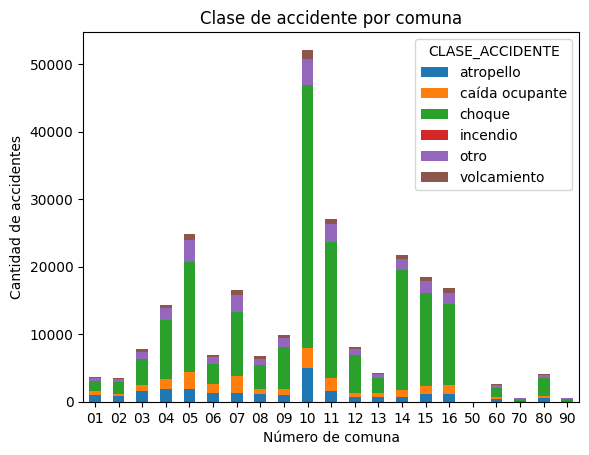

In [82]:
df_grouped = df.groupby(['NUMCOMUNA', 'CLASE_ACCIDENTE'])
df_grouped.size().unstack().plot(kind='bar',stacked = True, rot=0, title='Clase de accidente por comuna', xlabel='Número de comuna', ylabel='Cantidad de accidentes')

Gráfico 29. Cantidad de accidentes por según su clase por número de comuna.

<AxesSubplot: title={'center': 'Clase de accidente y gravedad'}, xlabel='Gravedad', ylabel='Cantidad de accidentes'>

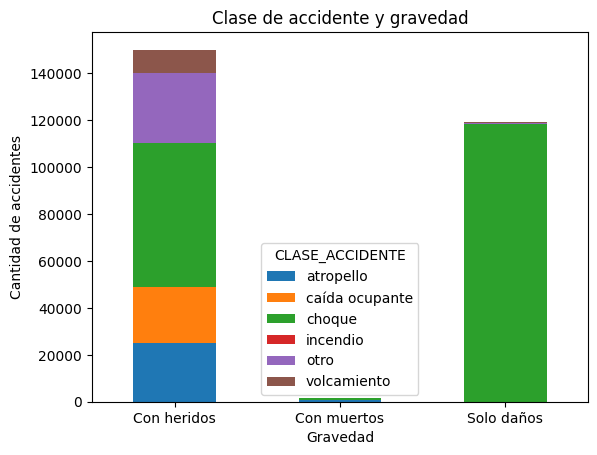

In [83]:
df_grouped = df.groupby(['GRAVEDAD_ACCIDENTE', 'CLASE_ACCIDENTE'])
df_grouped.size().unstack().plot(kind='bar',stacked = True, rot=0, title='Clase de accidente y gravedad', xlabel='Gravedad', ylabel='Cantidad de accidentes')

Gráfico 30. Cantidad de accidentes según su clase por categoría de gravedad.

# Construcción de modelos

In [84]:
df

,AÑO,CBML,CLASE_ACCIDENTE,DIRECCION,DIRECCION ENCASILLADA,DISEÑO,EXPEDIENTE,FECHA_ACCIDENTE,FECHA_ACCIDENTES,GRAVEDAD_ACCIDENTE,...,NRO_RADICADO,NUMCOMUNA,BARRIO,COMUNA,LOCATION,X,Y,holiday,longitud,latitud
0,2015,1013,caída ocupante,CR 46 CL 43,CR 046 043 000 00000,Tramo de via,A000259731,2015-10-21 05:58:00,2015-10-21 05:58:00-05:00,Con heridos,...,1508668,10,Barrio Colón,La Candelaria,"[-75.5688011014, 6.24312304123]",834949.69,1182357.34,False,-75.568801,6.243123
1,2015,1020,choque,CR 43 A CL 29,CR 043 A 029 000 00000,Tramo de via,A000261725,2015-05-11 03:00:00,2015-11-05 03:00:00-05:00,Solo daños,...,1510621,10,San Diego,La Candelaria,"[-75.5693883283, 6.22870030622]",834880.17,1180762.02,False,-75.569388,6.228700
2,2015,0205,otro,CR 46 CL 37,CR 046 037 000 00000,Tramo de via,A000259739,2015-10-21 07:40:00,2015-10-21 07:40:00-05:00,Con heridos,...,1508691,02,La Francia,Santa Cruz,"[-75.5503911403, 6.29869502502]",837004.94,1188499.17,False,-75.550391,6.298695
3,2015,0101,atropello,CR 34 CL 112,CR 034 112 000 00000,Tramo de via,A000259752,2015-10-21 12:00:00,2015-10-21 12:00:00-05:00,Con heridos,...,1508694,01,Santo Domingo Savio No. 1,Popular,"[-75.5442195069, 6.30019383306]",837688.53,1188663.05,False,-75.544220,6.300194
4,2015,1504,choque,CR 50 CL 14,CR 050 014 000 00000,Tramo de via,A000259949,2015-03-11 06:16:00,2015-11-03 06:16:00-05:00,Solo daños,...,1510634,15,Santa Fé,Guayabal,"[-75.578180998, 6.21699243701]",833903.11,1179469.60,False,-75.578181,6.216992
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
270760,2020,1004,caída ocupante,CR 62 CL 59,CR 062 059 000 00000,Tramo de via,A001164101,2020-08-31 18:50:00,2020-08-31 18:50:00-05:00,Con heridos,...,1722059,10,El Chagualo,La Candelaria,"[-75.5731343044, 6.26063534822]",834475.51,1184295.99,False,-75.573134,6.260635
270761,2020,1115,otro,CL 50 CR 74,CL 050 074 000 00000,Tramo de via,A001164214,2020-08-31 18:50:00,2020-08-31 18:50:00-05:00,Con heridos,...,1722080,11,Cuarta Brigada,Laureles Estadio,"[-75.5902062951, 6.26040455473]",832585.61,1184275.87,False,-75.590206,6.260405
270762,2020,515,choque,CL 80 CR 65,CL 080 065 000 00000,Tramo de via,A001164472,2020-08-31 19:05:00,2020-08-31 19:05:00-05:00,Solo daños,...,1722288,05,Cementerio Universal,Castilla,"[-75.5735398111, 6.27625838886]",834435.55,1186024.41,False,-75.573540,6.276258
270763,2020,207,atropello,CL 104 CR 45,CL 104 045 000 00000,Tramo de via,A001164109,2020-08-31 19:30:00,2020-08-31 19:30:00-05:00,Con heridos,...,1722062,02,Villa del Socorro,Santa Cruz,"[-75.5515085985, 6.29359892373]",836879.66,1187935.77,False,-75.551509,6.293599


Como se observó en el análisis descriptivo, existen distintos niveles de accidentalidad entre las comunas y corregimientos en las franjas temporales de año, mes, días del mes, días de la semana y días festivos, discriminados por la clase y gravedad registrados en los accidentes vehiculares. Por lo que se crean variables temporales en los niveles mencionados anteriormente, y así procedemos a construir los modelos predictivos para los años 2021 y 2022, usando los accidentes del año 2019 y 2020 para su respectiva validación. Para evaluar el éxito de la predicción de los modelos, utilizamos como métrica el MAE (error medio absoluto) debido a que no les da tanta importancia a los valores atípicos.

## Modelado ventana de un día

Los datos utilizados para entrenar el modelo, son los registros desde 2014 hasta 2018 (TRAIN), y los datos para validar el modelo pertenecen a los años 2019 y 2020 (TEST).

### Creación de las variables TRAIN, TEST, VAL, para Choque

Inicialmente se declaran varias funciones que serán de gran utilidad en el desarrollo de los modelos, esto con el fin de lograr un código limpio y con implementación de buenas prácticas de desarrollo en cuanto a duplicación de código se refiere. Seguido esto y con ayuda de las funciones implementadas, se obtienen los datasets de entrenamiento, testeo y validación.

In [85]:
from datetime import datetime

def windows_for_day(df_batch):
    df_batch["YEAR"] = df_batch.FECHA_ACCIDENTES.dt.year.astype(int)
    df_batch["MONTH"] = df_batch.FECHA_ACCIDENTES.dt.month.astype(int)
    df_batch["DAY"] = df_batch.FECHA_ACCIDENTES.dt.day.astype(int)
    groupby = df_batch.groupby(["YEAR", "MONTH", "DAY", "CLASE_ACCIDENTE"]).size().reset_index(level=3)
    groupby = groupby.rename(columns = {0:"ACCIDENTS"})
    return groupby

def feature_engeenier(df):
    df["DATE"] = df.apply(lambda row: datetime(int(row.YEAR), int(row.MONTH), int(row.DAY)), axis=1)
    df["IS_HOLIDAY"] = df.DATE.apply(lambda x: str(x) in co_holidays)
    df['QUARTER'] = df['DATE'].dt.quarter
    df['YEAROFWEEK'] = df.DATE.dt.weekofyear
    return df

def is_fortnight(df):
    MASK = (df.DAY == 15) | (df.DAY == 30)
    df["IS_FORTNIGHT"] = False
    df.loc[MASK, "IS_FORTNIGHT"] = True
    FEBRERO =  (df.MONTH == 2) & (df.DAY== 28 )
    df.loc[FEBRERO, "IS_FORTNIGHT"] = True
    return df

def converts_categorical(df):
    df["MONTH"] = pd.Categorical(df["MONTH"])
    df["DAY"] = pd.Categorical(df["DAY"])
    df['YEAROFWEEK'] =  pd.Categorical(df['YEAROFWEEK'])
    df["ACCIDENTS"] = pd.Categorical(df['ACCIDENTS'])
    df["QUARTER"] = pd.Categorical(df['QUARTER'])
    df["IS_HOLIDAY"] = pd.Categorical(df['IS_HOLIDAY'])
    df["IS_FORTNIGHT"] = pd.Categorical(df['IS_FORTNIGHT'])
    return df

def multi_regresion(p):
    choque = p[p.CLASE_ACCIDENTE == "choque"].ACCIDENTS
    atropello = p[p.CLASE_ACCIDENTE == "atropello"].ACCIDENTS
    caida = p[p.CLASE_ACCIDENTE == "caída ocupante"].ACCIDENTS
    otro = p[p.CLASE_ACCIDENTE == "otro"].ACCIDENTS
    volcamiento = p[p.CLASE_ACCIDENTE == "volcamiento"].ACCIDENTS
    incendio = p[p.CLASE_ACCIDENTE == "incendio"].ACCIDENTS
    values = pd.concat([choque, atropello, caida, otro, volcamiento, incendio], axis=1)
    values = values.fillna(0)
    return values.reset_index()

def clean_df(df):
    df = df.drop(columns = ["DATE"], axis=1)
    return df

def slipts_train_val_test(df):
    train = df[df.YEAR.isin([ 2014, 2015, 2016, 2018])]
    val = df[df.YEAR.isin([2019, 2020])]
    test = df[df.YEAR.isin([2021, 2022])]
    print("Shape train", train.shape)
    print("Shape val", val.shape)
    print("Shape test", test.shape)
    return train, val, test

def divide_X_y(df):
    X = df.drop(["ACCIDENTS", "YEAROFWEEK", "YEAR"], axis=1)
    y = df.ACCIDENTS.values
    week = df.YEAROFWEEK
    year = df.YEAR
    return X, y, week, year
    

In [86]:
def gets_variable(df):

    train, val, test = df.pipe(
        windows_for_day
        ).pipe(
            multi_regresion
        ).pipe(
            feature_engeenier
        ).pipe(
            is_fortnight
        ).pipe(
            slipts_train_val_test
        )

    X_train, y_train, week_train, year_train = train.pipe(clean_df).pipe(divide_X_y)
    X_val, y_val, week_val, year_test = val.pipe(clean_df).pipe(divide_X_y)
    datasets = {"X_train":X_train, "y_train":y_train, "X_val": X_val, "y_val":y_val}
    week = {"val":week_val, "train": week_train}
    year = {"val":year_test, "train":year_train }
    return datasets, week, year 

In [87]:
caide_ocupante = df.CLASE_ACCIDENTE.unique()[0]
datasets, week, year = gets_variable(df)

Shape train (1277, 14)
Shape val (609, 14)
Shape test (0, 14)


<b> Xtrain: </b>

In [88]:
datasets["X_train"]

,MONTH,DAY,IS_HOLIDAY,QUARTER,IS_FORTNIGHT
0,7,4,False,3,False
1,7,5,False,3,False
2,7,6,False,3,False
3,7,7,False,3,False
4,7,8,False,3,False
...,...,...,...,...,...
1637,12,27,False,4,False
1638,12,28,False,4,False
1639,12,29,False,4,False
1640,12,30,False,4,True


In [89]:
#Pipeline
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import OneHotEncoder
# Models
from sklearn.linear_model import LinearRegression, ElasticNet
from sklearn.svm import LinearSVC
from sklearn.neighbors import KNeighborsRegressor
from xgboost import XGBRegressor
from sklearn.impute import SimpleImputer
from sklearn.model_selection import GridSearchCV
from sklearn.multioutput import MultiOutputRegressor
#Metrics
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
# Plots
from matplotlib import pyplot as plt


imputer = SimpleImputer(strategy="most_frequent")
pre_processing = make_pipeline(
    imputer,
    OneHotEncoder(handle_unknown="ignore"),

)

def plot_scatterplot( x_feature, y_feature, title, texto= '', xlabel='Y_pred', yLabel='Y_true',):
    plt.scatter(x_feature, y_feature)
    plt.xlabel(xlabel)
    plt.ylabel(yLabel)
    plt.text(140, 60, texto , fontsize = 10)
    plt.title(title)
    plt.show()

def plot_residual( y_test, y_pred, title):
    residual =  y_test - y_pred
    plt.scatter(y_pred, residual)
    plt.xlabel("Residuales")
    plt.ylabel("Predicción")
    plt.title(title)
    plt.show()

def get_metrics(y_true, y_pred, title):
    mse = mean_squared_error(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    rmse = mse**(1/2)
    text = 'MSE: ' + str(mse) + '\nMAE: ' + str(mae) + '\nRSME: ' + str(rmse)
    plot_scatterplot(y_true, y_pred, title + " Y_pred vs Y_real", texto=text)
    plot_residual(y_true, y_pred,title + " Y_pred vs Residuales")

def train_model(pipeline, datasets, param_grid = None, cv = 8):

    if param_grid is not None:
        pipeline = GridSearchCV(
            estimator=pipeline,
            param_grid=param_grid,
            cv=cv,
            refit=True,
            return_train_score=False,
            verbose = 3
         )
        
    pipeline.fit(X = datasets["X_train"], y = datasets["y_train"])
    y_pred_train = pipeline.predict( datasets["X_train"]).astype(int)
    y_pred = pipeline.predict(datasets["X_val"]).astype(int)
    get_metrics(datasets["y_train"], y_pred_train, "Dataset Entrenamiento")
    get_metrics(datasets["y_val"], y_pred, "Dataset Entrenamiento")
    return pipeline

## Predicción diaria

<b>Model_ln</b>

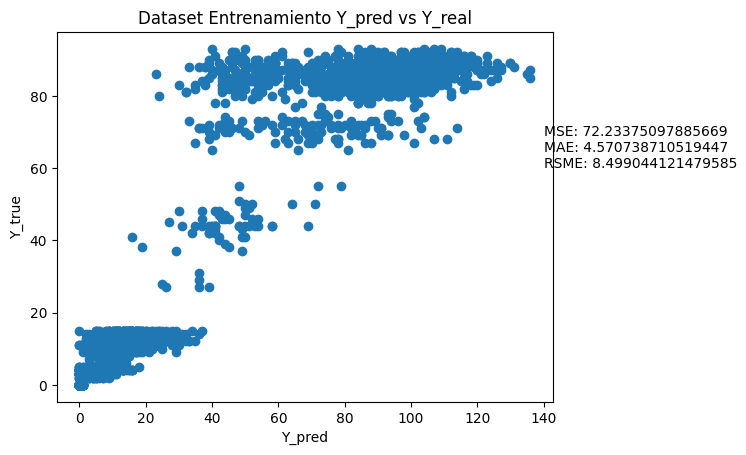

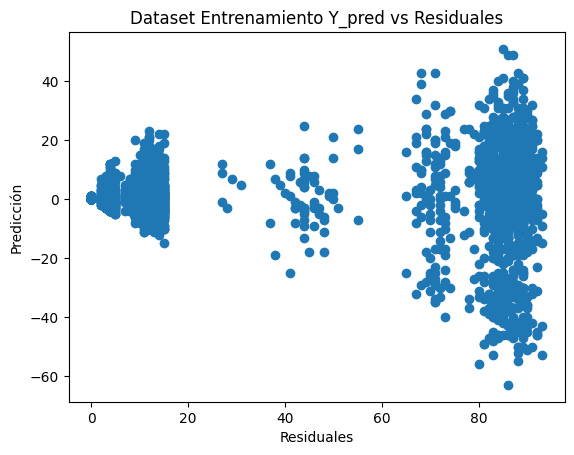

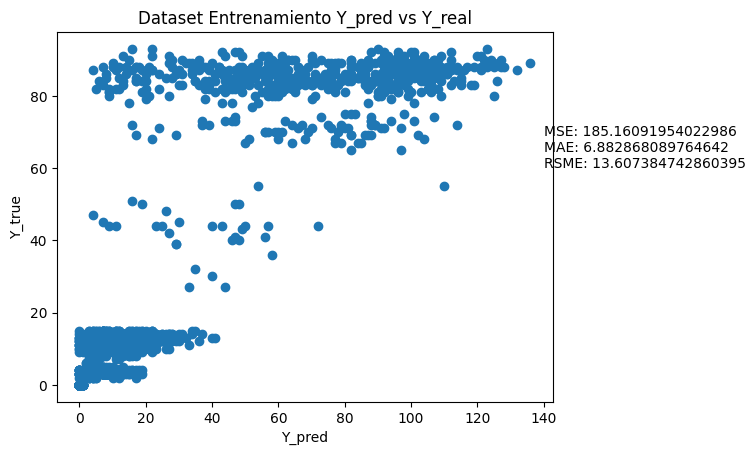

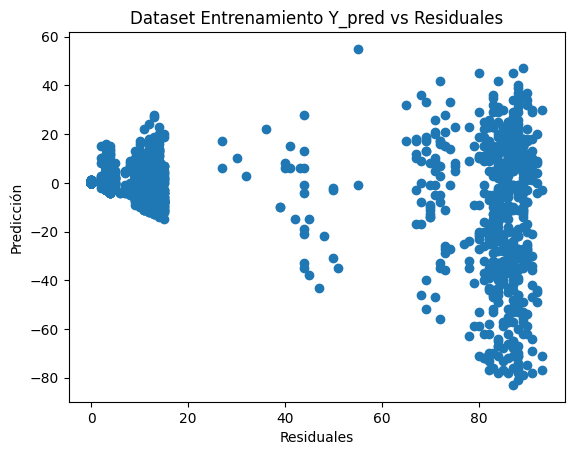

In [91]:
def ln(datasets):
    ln_pipeline = make_pipeline(
        pre_processing,
        MultiOutputRegressor(LinearRegression())
    )
    model_ln = train_model(ln_pipeline, datasets)
    return model_ln
model_ln = ln(datasets)

<b>Model_el</b>

Fitting 8 folds for each of 24 candidates, totalling 192 fits
[CV 1/8] END multioutputregressor__estimator__alpha=1e-05, multioutputregressor__estimator__l1_ratio=0.0;, score=-0.163 total time=   1.1s
[CV 2/8] END multioutputregressor__estimator__alpha=1e-05, multioutputregressor__estimator__l1_ratio=0.0;, score=-0.024 total time=   1.1s
[CV 3/8] END multioutputregressor__estimator__alpha=1e-05, multioutputregressor__estimator__l1_ratio=0.0;, score=-0.060 total time=   1.0s
[CV 4/8] END multioutputregressor__estimator__alpha=1e-05, multioutputregressor__estimator__l1_ratio=0.0;, score=-0.038 total time=   1.0s
[CV 5/8] END multioutputregressor__estimator__alpha=1e-05, multioutputregressor__estimator__l1_ratio=0.0;, score=-0.045 total time=   1.0s
[CV 6/8] END multioutputregressor__estimator__alpha=1e-05, multioutputregressor__estimator__l1_ratio=0.0;, score=0.028 total time=   1.1s
[CV 7/8] END multioutputregressor__estimator__alpha=1e-05, multioutputregressor__estimator__l1_ratio=0.0;

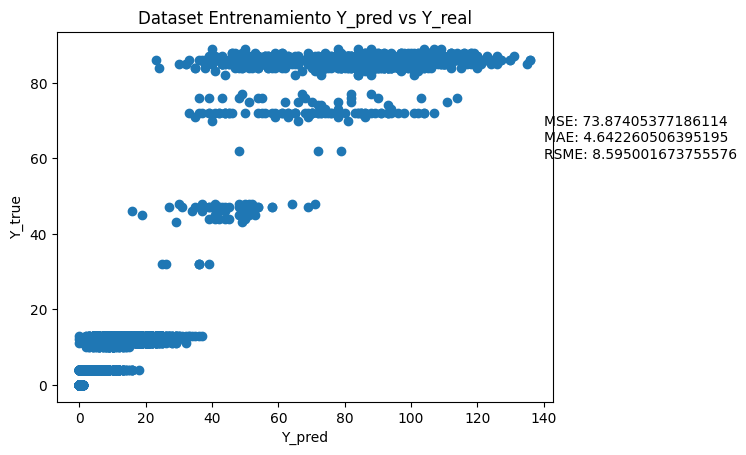

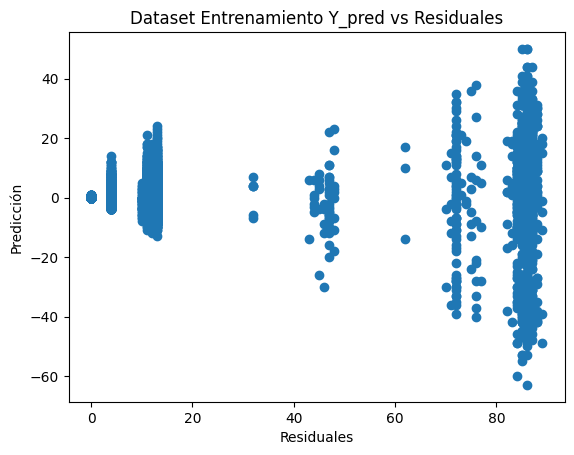

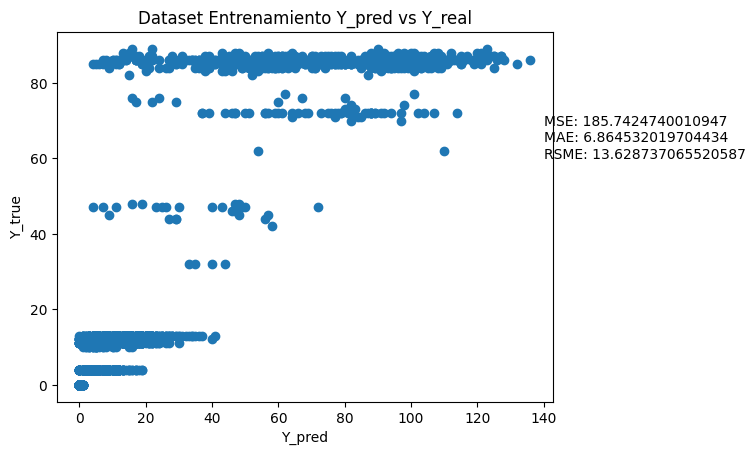

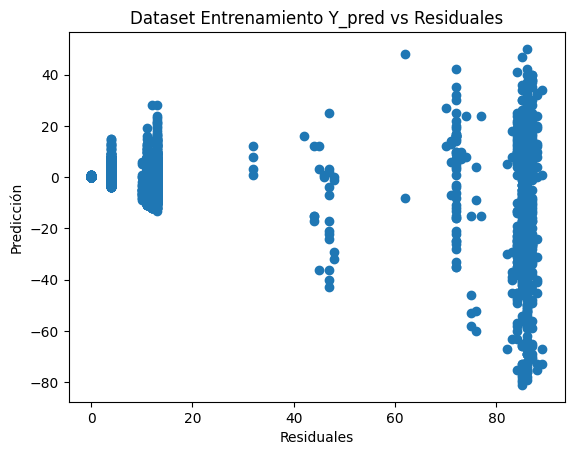

Best Score: -0.03921622509114826
Best Hyperparameters: {'multioutputregressor__estimator__alpha': 0.1, 'multioutputregressor__estimator__l1_ratio': 1.0}


In [93]:

el_pipeline = make_pipeline(
    pre_processing,
   MultiOutputRegressor(ElasticNet()),
)

param_grid = [{
    'multioutputregressor__estimator__l1_ratio':np.linspace(0,1,3),
    'multioutputregressor__estimator__alpha': [1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1, 10, 100],
    
    }]
model_el = train_model(el_pipeline, datasets, param_grid)
print('Best Score: %s' % model_el.best_score_)
print('Best Hyperparameters: %s' % model_el.best_params_)



<b> Model_knn</b>

Fitting 8 folds for each of 100 candidates, totalling 800 fits
[CV 1/8] END multioutputregressor__estimator__algorithm=auto, multioutputregressor__estimator__n_neighbors=5;, score=-0.359 total time=   0.0s
[CV 2/8] END multioutputregressor__estimator__algorithm=auto, multioutputregressor__estimator__n_neighbors=5;, score=-0.139 total time=   0.1s
[CV 3/8] END multioutputregressor__estimator__algorithm=auto, multioutputregressor__estimator__n_neighbors=5;, score=-0.308 total time=   0.0s
[CV 4/8] END multioutputregressor__estimator__algorithm=auto, multioutputregressor__estimator__n_neighbors=5;, score=-0.148 total time=   0.0s
[CV 5/8] END multioutputregressor__estimator__algorithm=auto, multioutputregressor__estimator__n_neighbors=5;, score=-0.166 total time=   0.0s
[CV 6/8] END multioutputregressor__estimator__algorithm=auto, multioutputregressor__estimator__n_neighbors=5;, score=-0.184 total time=   0.0s
[CV 7/8] END multioutputregressor__estimator__algorithm=auto, multioutputregres

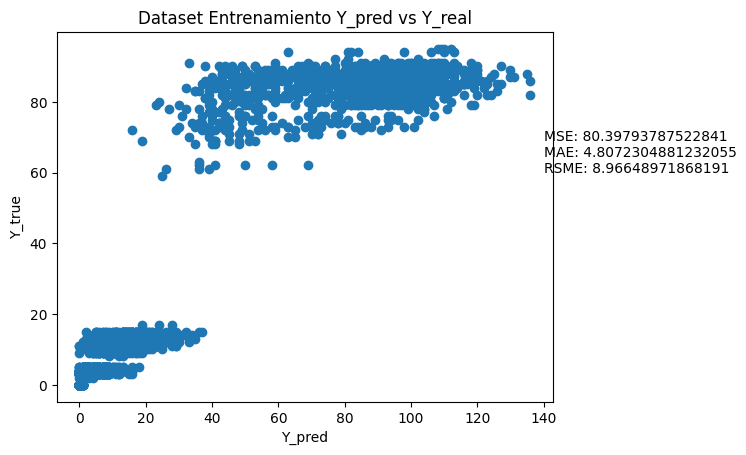

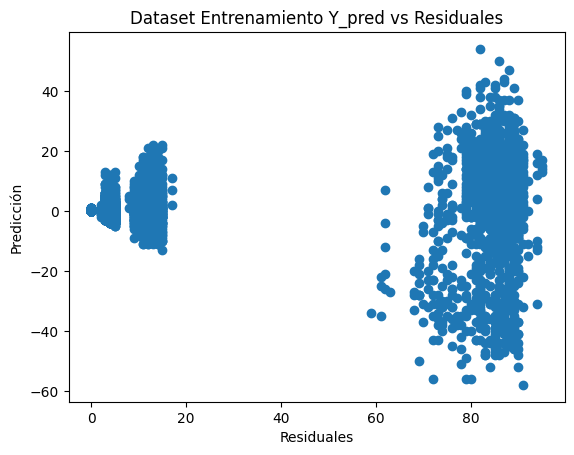

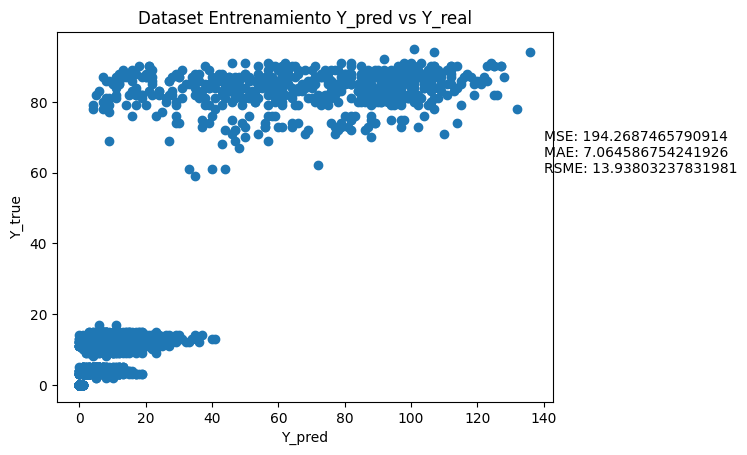

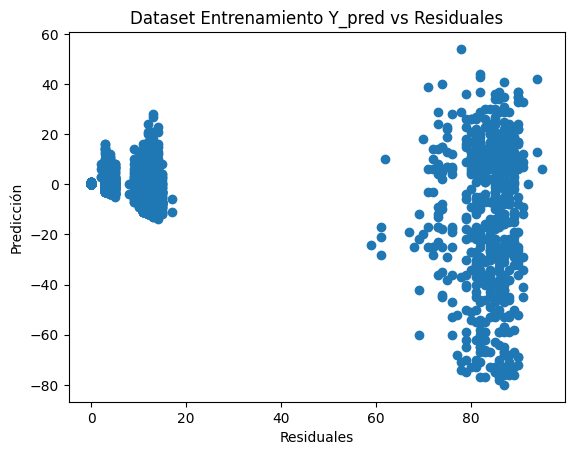

Best Score: -0.11452073037967013
Best Hyperparameters: {'multioutputregressor__estimator__algorithm': 'auto', 'multioutputregressor__estimator__n_neighbors': 29}


In [95]:
knn_pipeline = make_pipeline(
    pre_processing,
    MultiOutputRegressor(KNeighborsRegressor())
)

param_grid = [
    {
        "multioutputregressor__estimator__n_neighbors": range(5, 30),
        "multioutputregressor__estimator__algorithm": ['auto', 'ball_tree', 'kd_tree', 'brute'],
    }
]
model_knn = train_model(knn_pipeline, datasets, param_grid)
print('Best Score: %s' % model_knn.best_score_)
print('Best Hyperparameters: %s' % model_knn.best_params_)

Con un MAE de *****, el error medio en la predicción es menor a ***** incidencias vehiculares por día.

Fitting 3 folds for each of 32 candidates, totalling 96 fits
[CV 1/3] END multioutputregressor__estimator__loss=hinge, multioutputregressor__estimator__multi_class=ovr, multioutputregressor__estimator__penalty=l1, multioutputregressor__estimator__tol=1e-05;, score=nan total time=   0.0s
[CV 2/3] END multioutputregressor__estimator__loss=hinge, multioutputregressor__estimator__multi_class=ovr, multioutputregressor__estimator__penalty=l1, multioutputregressor__estimator__tol=1e-05;, score=nan total time=   0.0s
[CV 3/3] END multioutputregressor__estimator__loss=hinge, multioutputregressor__estimator__multi_class=ovr, multioutputregressor__estimator__penalty=l1, multioutputregressor__estimator__tol=1e-05;, score=nan total time=   0.0s
[CV 1/3] END multioutputregressor__estimator__loss=hinge, multioutputregressor__estimator__multi_class=ovr, multioutputregressor__estimator__penalty=l1, multioutputregressor__estimator__tol=0.0001;, score=nan total time=   0.0s
[CV 2/3] END multioutputregres

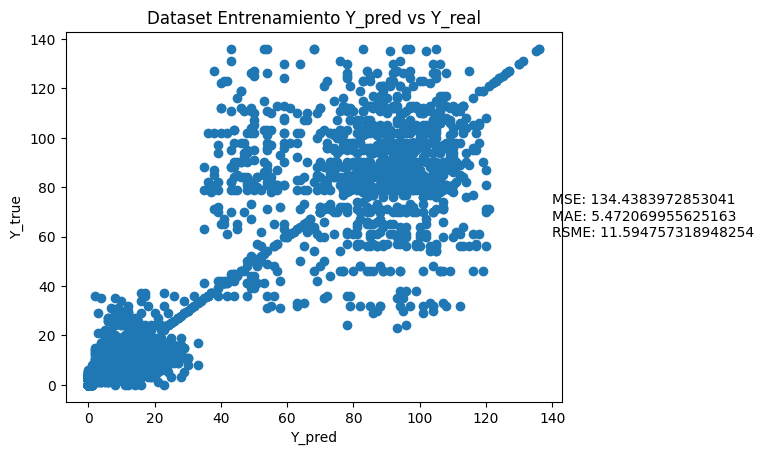

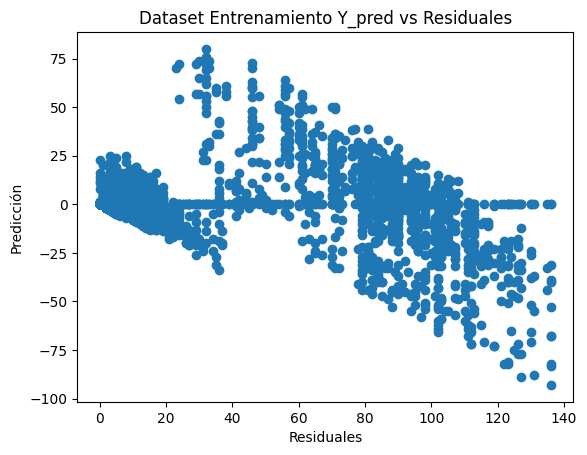

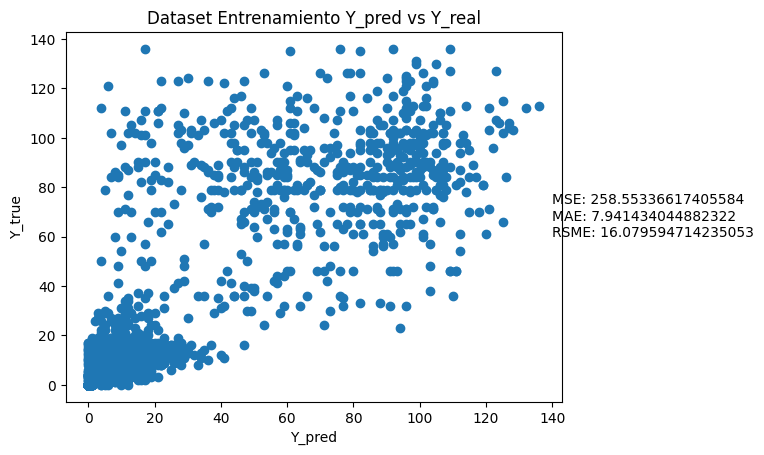

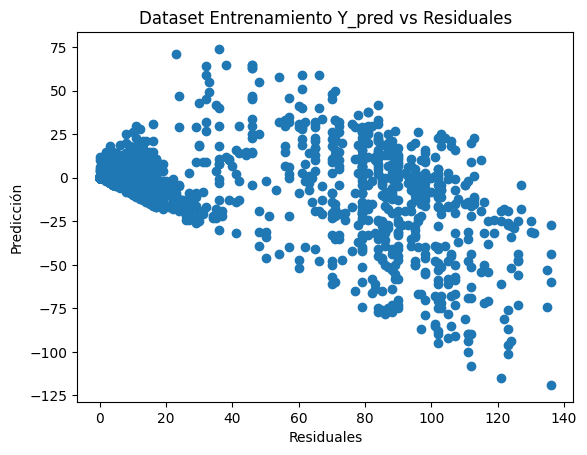

Best Score: -0.6699110488841354
Best Hyperparameters: {'multioutputregressor__estimator__loss': 'squared_hinge', 'multioutputregressor__estimator__multi_class': 'ovr', 'multioutputregressor__estimator__penalty': 'l2', 'multioutputregressor__estimator__tol': 0.0001}


In [97]:
SVC_pipeline = make_pipeline(
    pre_processing,
    MultiOutputRegressor(LinearSVC())
)

param_grid = [
    {
        "multioutputregressor__estimator__penalty": ["l1", "l2"],
        "multioutputregressor__estimator__loss": ["hinge", "squared_hinge"],
        "multioutputregressor__estimator__tol":(1e-5,1e-4,1e-3,1e-2),
        "multioutputregressor__estimator__multi_class":["ovr", "crammer_singer"]
    }
]
SVC_pipeline = train_model(SVC_pipeline, datasets, param_grid,  cv=3)
print('Best Score: %s' % SVC_pipeline.best_score_)
print('Best Hyperparameters: %s' % SVC_pipeline.best_params_)

In [98]:
import joblib
joblib.dump(model_ln, f"multi_regresion.pkl")

['multi_regresion.pkl']

Con un MAE de 4.5707, el error medio en la predicción del modelo 1 es menor a 5 incidencias vehiculares por día.

Con un MAE de 6.8828, el error medio en la predicción del modelo 2 es menor a 7 incidencias vehiculares por día.

Con un MAE de 4.6422, el error medio en la predicción del modelo 3 es menor a 5 incidencias vehiculares por día.

Con un MAE de 6.8645, el error medio en la predicción del modelo 4 es menor a 7 incidencias vehiculares por día.

Con un MAE de 4.8072, el error medio en la predicción del modelo 5 es menor a 5 incidencias vehiculares por día.

Con un MAE de 7.0646, el error medio en la predicción del modelo 6 es menor a 8 incidencias vehiculares por día.

Con un MAE de 5.4720, el error medio en la predicción del modelo 7 es menor a 6 incidencias vehiculares por día.

Con un MAE de 7.94, el error medio en la predicción del modelo 8 es menor a 8 incidencias vehiculares por día.

Basándonos en el MAE, los mejores resultados se obtienen usando el modelo 1 (modelo de regresión lineal), el cual se obtuvo al hacer una transformación (aplicando logaritmo natural) de variables para minimizar el error, por lo tanto es el mejor modelo de regresión lineal para predecir accidentes vehiculares por día en el municipio de Medellín.

## Predicción mensual

Luego de haber planteado diversas opciones de posibles modelos y de haber elegido el mejor de ellos, se utiliza dicho modelo seleccionado para continuar con las demás predicciones.

In [ ]:
#Lo primero que vamos a hacer es utilizar nuestro modelo anterior, que el mejor fue el lineal
def month_train(X,y, year, model_ln, title):
    name_columns = ["choque","atropello","caída ocupante","otro","volcamiento","incendio"]
    name_columns_pred = list(map(lambda x: x + "_pred", name_columns))
    name_columns_true = list(map(lambda x: x + "_true", name_columns))

    X_train_month = X.copy(deep=True)
    X_train_month["YEAR"] = year
    
    y_pred = model_ln.predict(X).astype(int)
    y_pred_df = pd.DataFrame(y_pred.astype(int), columns=name_columns_pred)
    print('X_train_month shape: ',X_train_month.shape)
    print('Y_pred_df shape: ', y_pred_df.shape)
    print('Y pred shape: ', y_pred.shape)
    y_real = pd.DataFrame(y, columns=name_columns_true )
    v = pd.concat([X_train_month, y_real], axis=1, ignore_index=True, join="inner")
    
    #groupby = X_train_month.groupby(["YEAR", "MONTH"]).sum().reset_index()
    #get_metrics(groupby[name_columns_true].values, groupby[name_columns_pred].values, title)
 
    return v

month_train(datasets["X_train"], datasets["y_train"], year["train"], model_ln, "Mensualida Entrenamiento")

(1277, 6)
(1277, 6)
(1277, 6)


,0,1,2,3,4,5,6,7,8,9,10,11
0,7,4,False,3,False,2014,24.0,0.0,0.0,0.0,0.0,0.0
1,7,5,False,3,False,2014,66.0,27.0,21.0,7.0,3.0,0.0
2,7,6,False,3,False,2014,43.0,17.0,12.0,13.0,0.0,0.0
3,7,7,False,3,False,2014,112.0,11.0,18.0,24.0,10.0,0.0
4,7,8,False,3,False,2014,87.0,7.0,14.0,15.0,3.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
907,12,27,False,4,False,2016,80.0,8.0,13.0,12.0,5.0,0.0
908,12,28,False,4,False,2016,103.0,4.0,12.0,13.0,4.0,0.0
909,12,29,False,4,False,2016,68.0,9.0,7.0,15.0,6.0,0.0
910,12,30,False,4,True,2016,80.0,19.0,12.0,15.0,8.0,0.0


In [193]:
datasets["X_train"]v m= 

,MONTH,DAY,IS_HOLIDAY,QUARTER,IS_FORTNIGHT
0,7,4,False,3,False
1,7,5,False,3,False
2,7,6,False,3,False
3,7,7,False,3,False
4,7,8,False,3,False
...,...,...,...,...,...
1637,12,27,False,4,False
1638,12,28,False,4,False
1639,12,29,False,4,False
1640,12,30,False,4,True


In [203]:
v =pd.DataFrame(datasets["y_train"]).reset_index(drop=True)

In [212]:
pd.concat([datasets["X_train"],v], axis=1 , ignore_index=True)

,0,1,2,3,4,5,6,7,8,9,10
0,7.0,4.0,False,3.0,False,24.0,0.0,0.0,0.0,0.0,0.0
1,7.0,5.0,False,3.0,False,66.0,27.0,21.0,7.0,3.0,0.0
2,7.0,6.0,False,3.0,False,43.0,17.0,12.0,13.0,0.0,0.0
3,7.0,7.0,False,3.0,False,112.0,11.0,18.0,24.0,10.0,0.0
4,7.0,8.0,False,3.0,False,87.0,7.0,14.0,15.0,3.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
1272,NaN,NaN,NaN,NaN,NaN,81.0,13.0,3.0,10.0,2.0,0.0
1273,NaN,NaN,NaN,NaN,NaN,92.0,6.0,7.0,7.0,1.0,0.0
1274,NaN,NaN,NaN,NaN,NaN,64.0,17.0,4.0,8.0,4.0,0.0
1275,NaN,NaN,NaN,NaN,NaN,38.0,6.0,7.0,11.0,2.0,0.0


In [155]:
F = month_train(datasets["X_val"], datasets["y_val"], year["val"],model_ln, "Validación Mensual")
F

,MONTH,DAY,IS_HOLIDAY,QUARTER,IS_FORTNIGHT,choque_pred,atropello_pred,caída ocupante_pred,otro_pred,volcamiento_pred,incendio_pred,YEAR
1642,1.0,1.0,True,1.0,False,NaN,NaN,NaN,NaN,NaN,NaN,2019.0
1643,1.0,2.0,False,1.0,False,NaN,NaN,NaN,NaN,NaN,NaN,2019.0
1644,1.0,3.0,False,1.0,False,NaN,NaN,NaN,NaN,NaN,NaN,2019.0
1645,1.0,4.0,False,1.0,False,NaN,NaN,NaN,NaN,NaN,NaN,2019.0
1646,1.0,5.0,False,1.0,False,NaN,NaN,NaN,NaN,NaN,NaN,2019.0
...,...,...,...,...,...,...,...,...,...,...,...,...
604,NaN,NaN,NaN,NaN,NaN,86.0,12.0,13.0,14.0,4.0,0.0,NaN
605,NaN,NaN,NaN,NaN,NaN,89.0,12.0,13.0,14.0,3.0,0.0,NaN
606,NaN,NaN,NaN,NaN,NaN,87.0,12.0,12.0,14.0,3.0,0.0,NaN
607,NaN,NaN,NaN,NaN,NaN,84.0,11.0,12.0,14.0,4.0,0.0,NaN


In [153]:
F

,MONTH,DAY,IS_HOLIDAY,QUARTER,IS_FORTNIGHT,choque_pred,atropello_pred,caída ocupante_pred,otro_pred,volcamiento_pred,incendio_pred,YEAR
1642,1.0,1.0,True,1.0,False,NaN,NaN,NaN,NaN,NaN,NaN,2019.0
1643,1.0,2.0,False,1.0,False,NaN,NaN,NaN,NaN,NaN,NaN,2019.0
1644,1.0,3.0,False,1.0,False,NaN,NaN,NaN,NaN,NaN,NaN,2019.0
1645,1.0,4.0,False,1.0,False,NaN,NaN,NaN,NaN,NaN,NaN,2019.0
1646,1.0,5.0,False,1.0,False,NaN,NaN,NaN,NaN,NaN,NaN,2019.0
...,...,...,...,...,...,...,...,...,...,...,...,...
604,NaN,NaN,NaN,NaN,NaN,86.0,12.0,13.0,14.0,4.0,0.0,NaN
605,NaN,NaN,NaN,NaN,NaN,89.0,12.0,13.0,14.0,3.0,0.0,NaN
606,NaN,NaN,NaN,NaN,NaN,87.0,12.0,12.0,14.0,3.0,0.0,NaN
607,NaN,NaN,NaN,NaN,NaN,84.0,11.0,12.0,14.0,4.0,0.0,NaN


## Predicción semanal

In [141]:
def week_train(X,y,week,year, model_ln):
    X_train_month = X.copy(deep=True)
    X_train_month["y_pred"] = model_ln.predict(X)
    X_train_month["ACCIDENTS"] = y
    X_train_month["YEAR"] = year
    X_train_month["WEEKOFYEAR"]  = week
    groupby = X_train_month.groupby(["YEAR", "WEEKOFYEAR"]).sum()[["ACCIDENTS","y_pred"]].reset_index()
    get_metrics(groupby.ACCIDENTS, groupby.y_pred, "Dataset Entrenamiento")

In [142]:
week_train(datasets["X_train"], datasets["y_train"], week["train"], year["train"], model_ln)

ValueError: Expected a 1D array, got an array with shape (1277, 6)

Con un MAE de 10.24, el error medio en la predicción es menor a 11 incidencias vehiculares por semana.

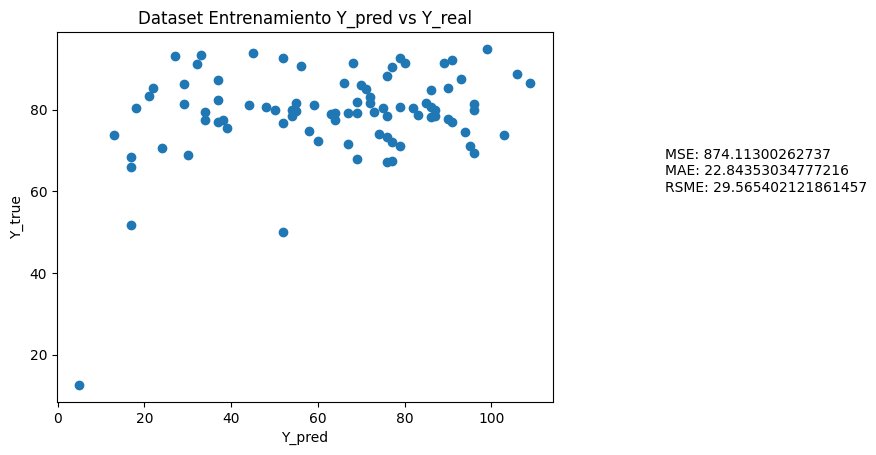

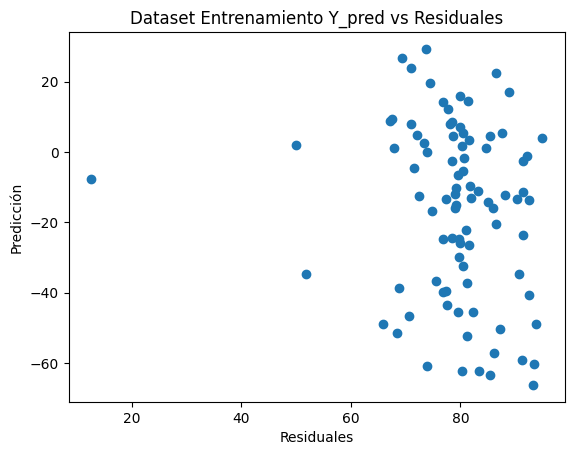

In [ ]:
week_train(datasets["X_val"], datasets["y_val"], week["val"], year["val"],model_ln)

*REVISAR

Con un MAE de 22.84, el error medio en la predicción es menor a 23 incidencias vehiculares por semana.

Basándonos en el MAE, los mejores resultados se obtienen usando primer modelo, el cual se obtuvo al hacer una transformación (aplicando logaritmo natural) de variables para minimizar el error, por lo tanto es el mejor modelo de regresión lineal para predecir accidentes vehiculares por semana en el municipio de Medellín.

Los siguientes modelos parten del tipo de accidente (CLASE).

## Predicción para choque

Como concluimos en el análisis descriptivo, la mayor causa de accidentalidad independientemente de la zona es por choque respecto a las anteriores unidades de tiempo, tal que se plantea los siguientes modelos predictivos.  

In [ ]:
type_accidents = df.CLASE_ACCIDENTE.unique()
def get_all_values(type_accident):
    datasets, week, year = gets_variable(type_accident)
    print("Graficas por dia")
    model_ln = ln(datasets)
    joblib.dump(model_ln, f"{type_accident}.pkl")
    print("Graficas por mes")
    month_train(datasets["X_train"], datasets["y_train"], year["train"], model_ln)
    month_train(datasets["X_val"], datasets["y_val"], year["val"],model_ln)
    print("Graficas por semanal")
    week_train(datasets["X_train"], datasets["y_train"], week["train"], year["train"], model_ln)
    week_train(datasets["X_val"], datasets["y_val"], week["val"], year["val"],model_ln)

caída ocupante
Shape train (1276, 9)
Shape val (601, 9)
Shape test (0, 9)
Graficas por dia


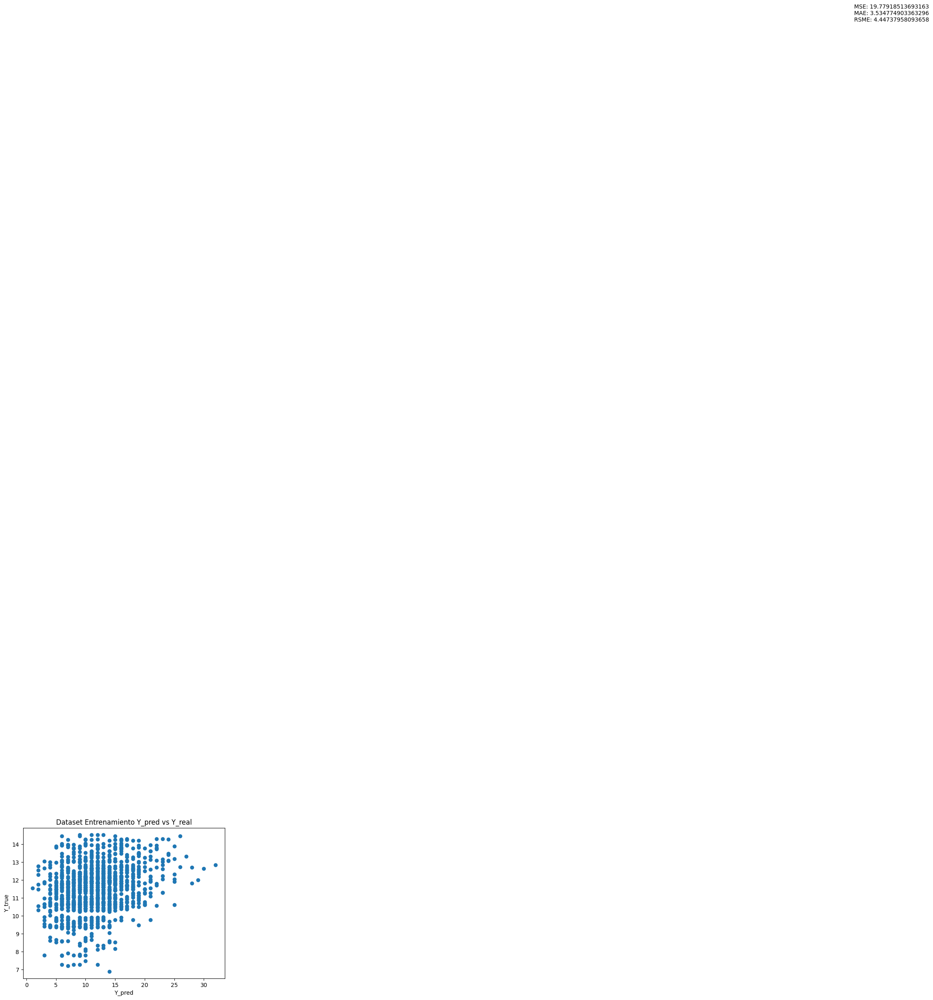

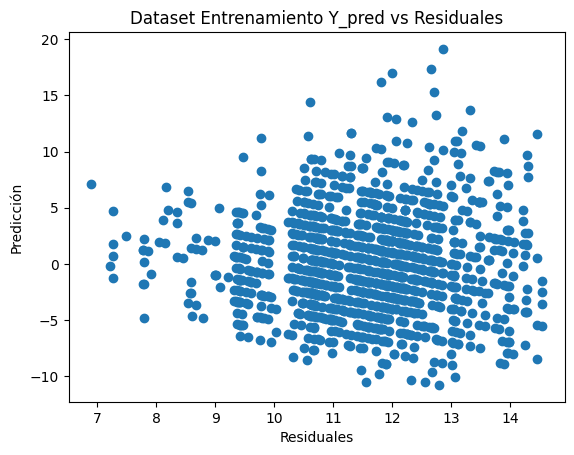

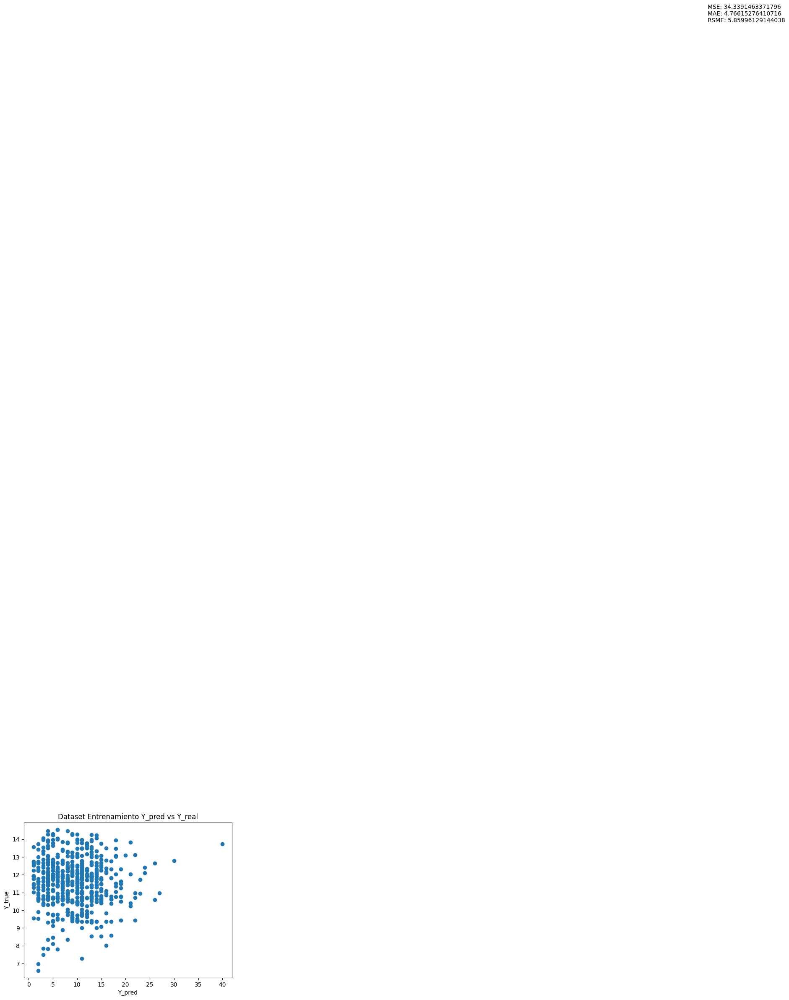

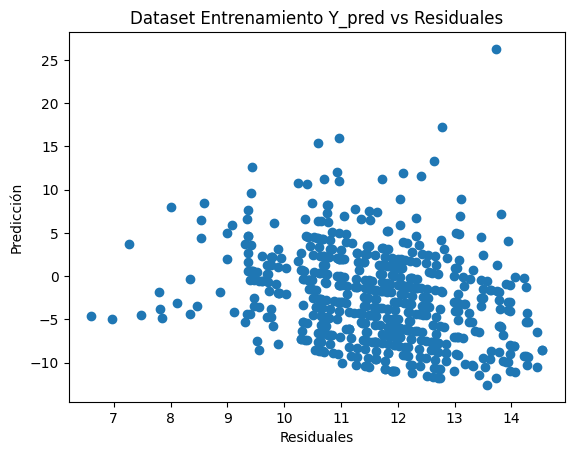

Graficas por mes

(42,) (42,)


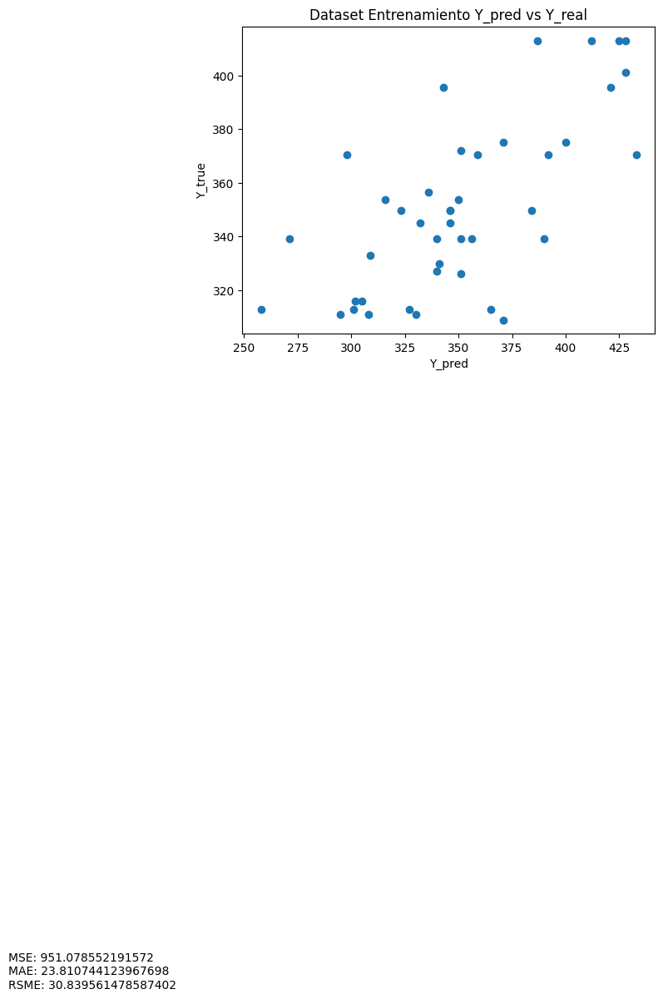

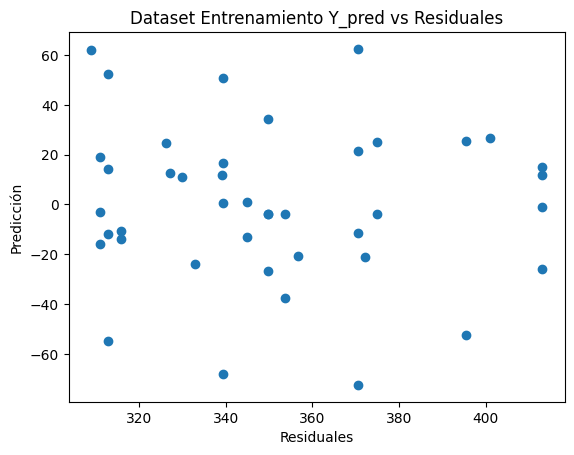


(20,) (20,)


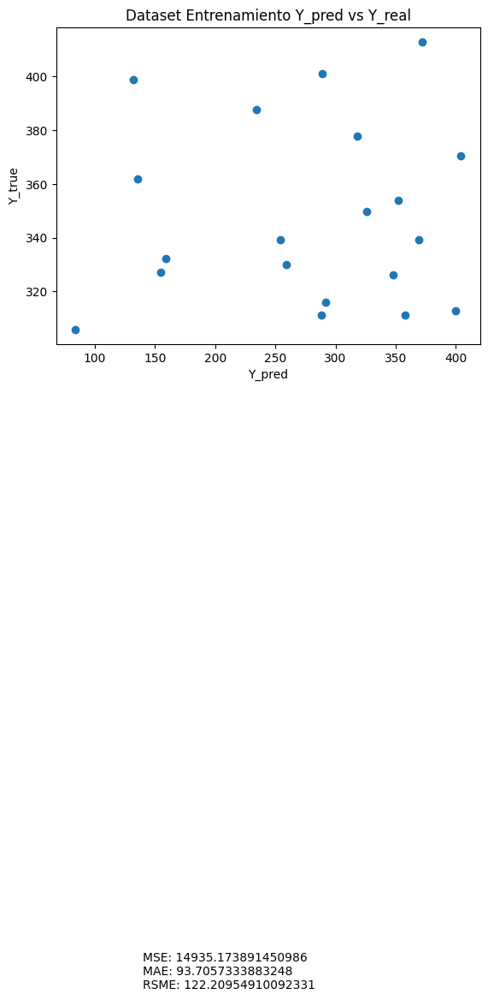

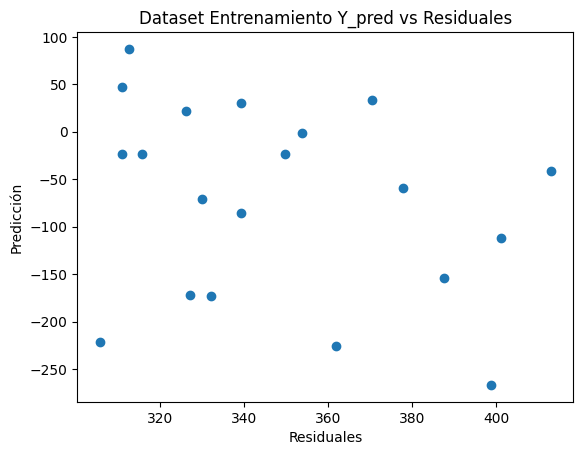

Graficas por semanal


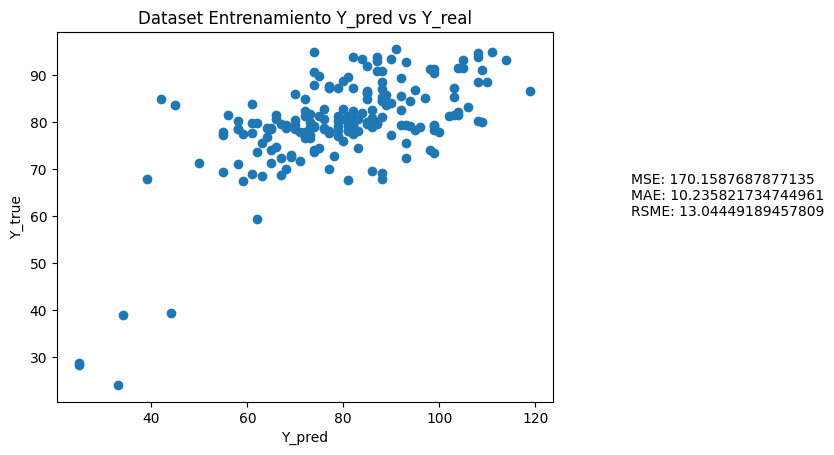

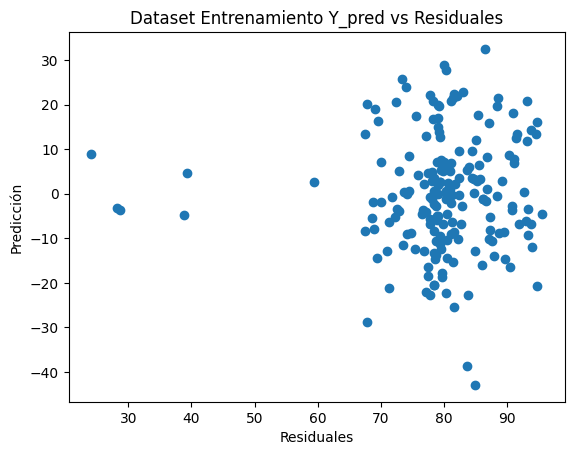

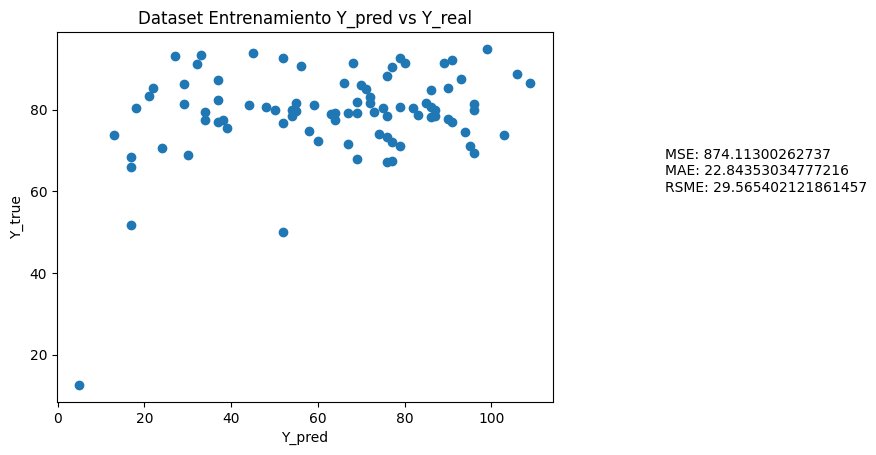

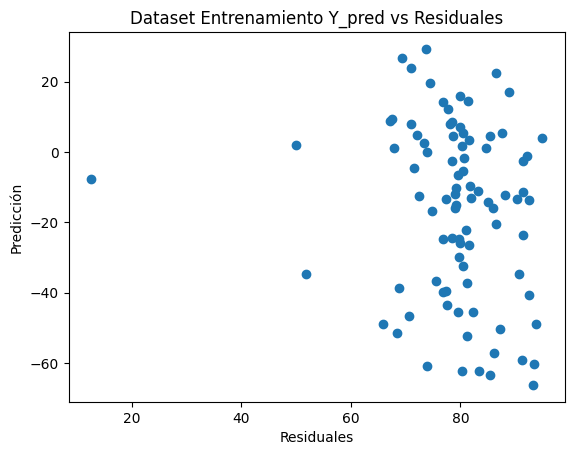

In [ ]:
get_all_values(type_accidents[0])

choque
Shape train (1277, 9)
Shape val (609, 9)
Shape test (0, 9)
Graficas por dia


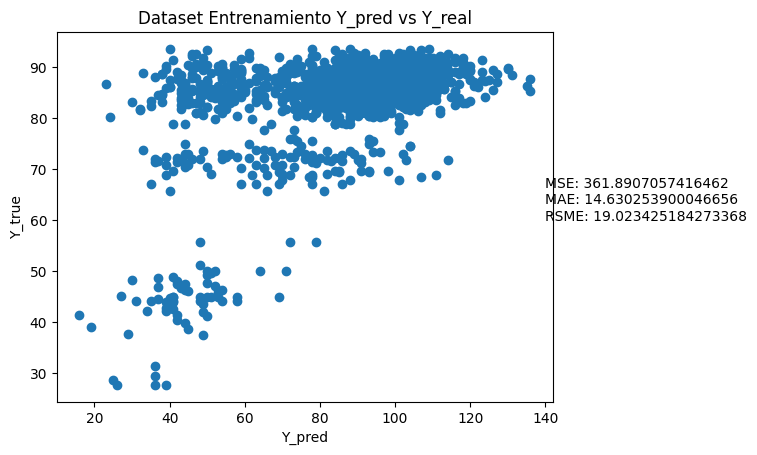

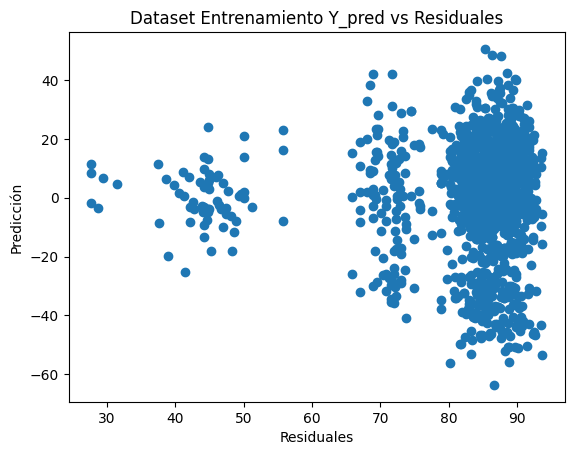

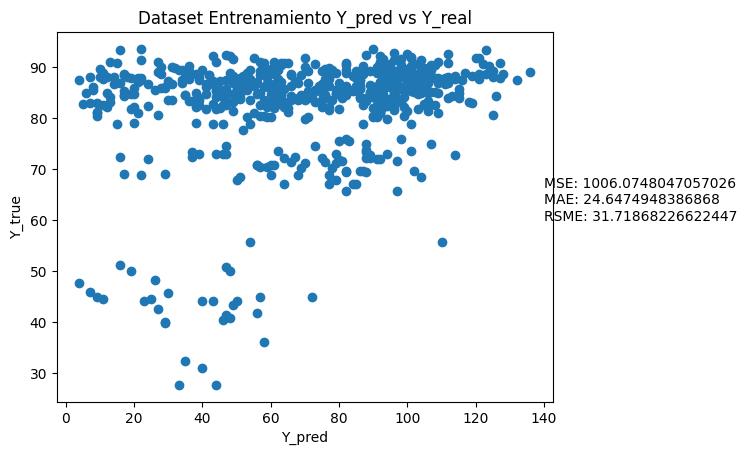

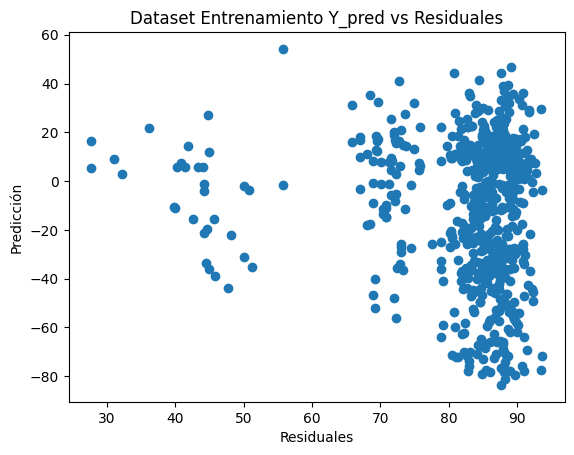

Graficas por mes

(42,) (42,)


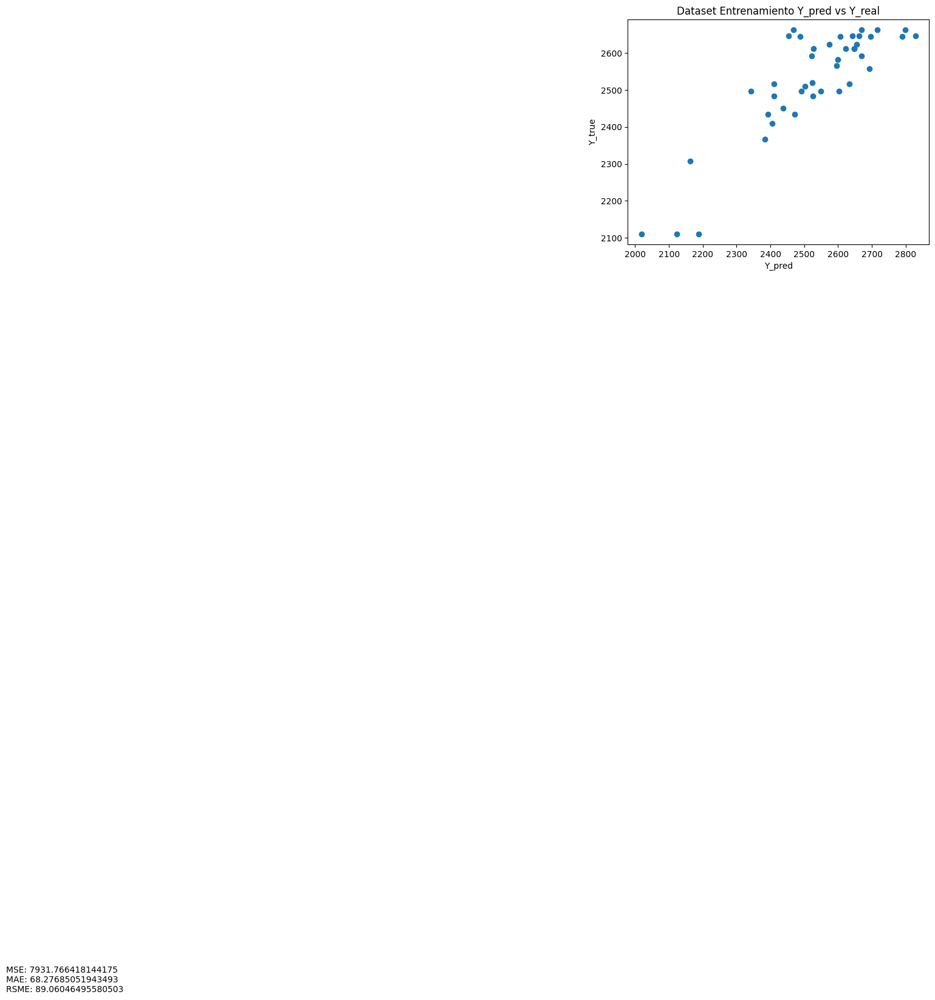

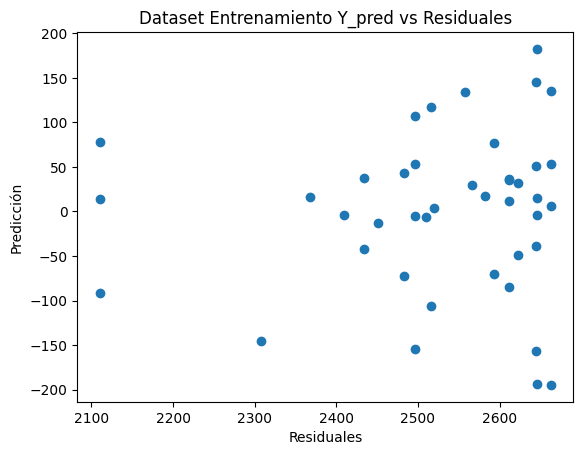


(20,) (20,)


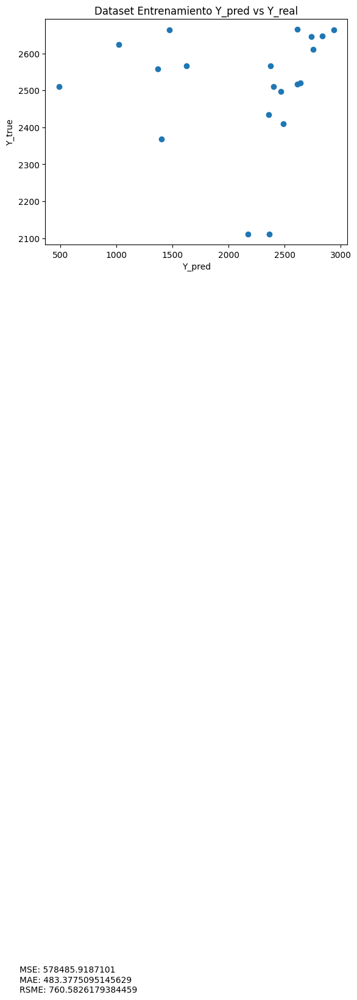

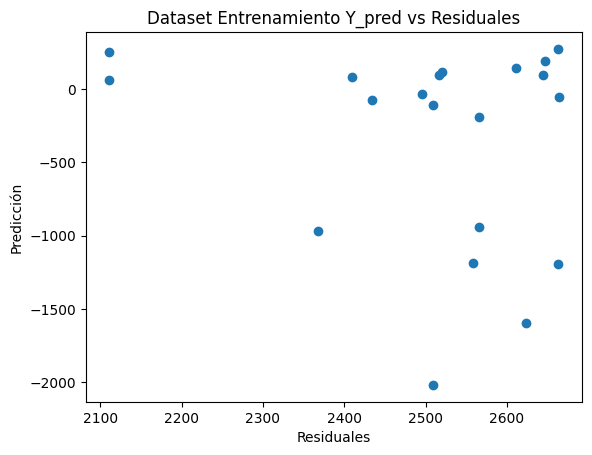

Graficas por semanal


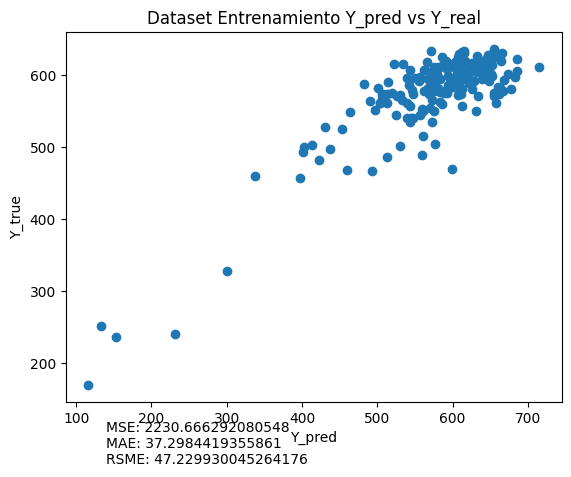

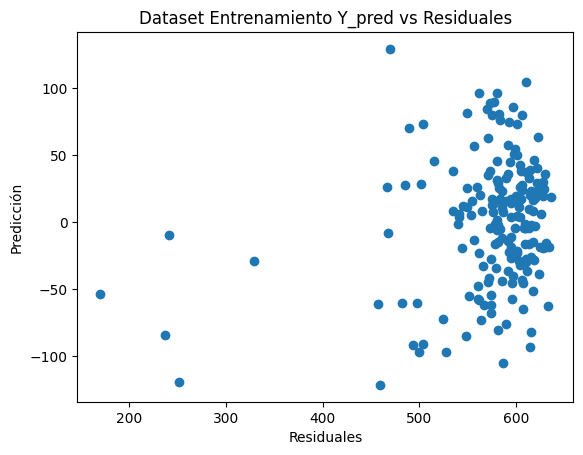

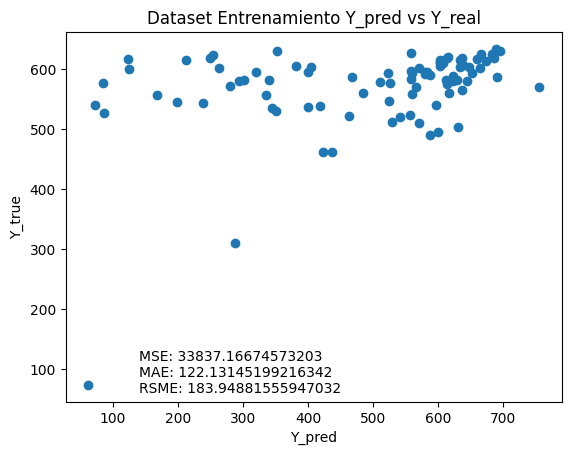

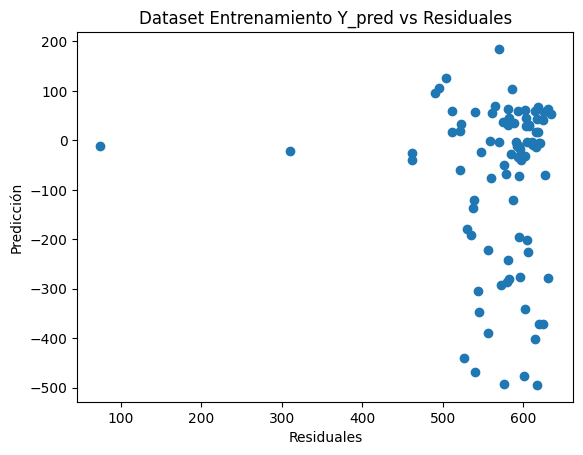

In [ ]:
get_all_values(type_accidents[1])

otro
Shape train (1276, 9)
Shape val (608, 9)
Shape test (0, 9)
Graficas por dia


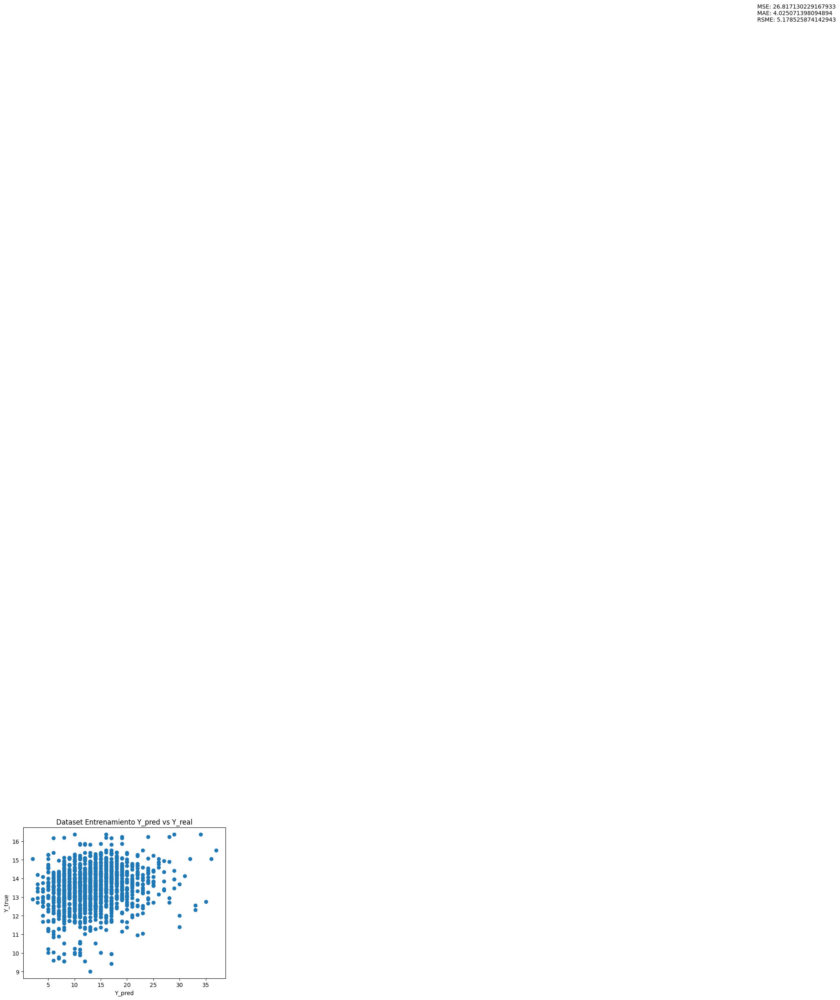

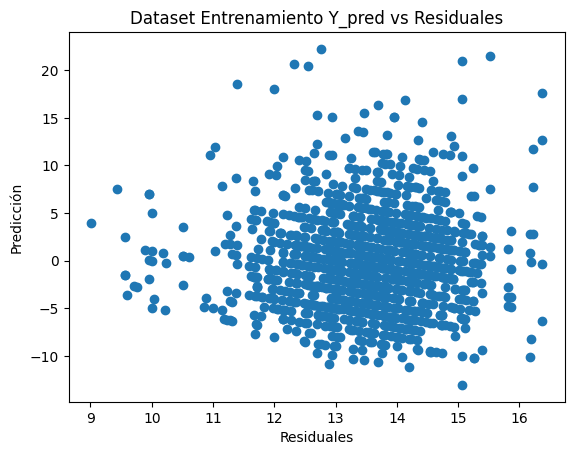

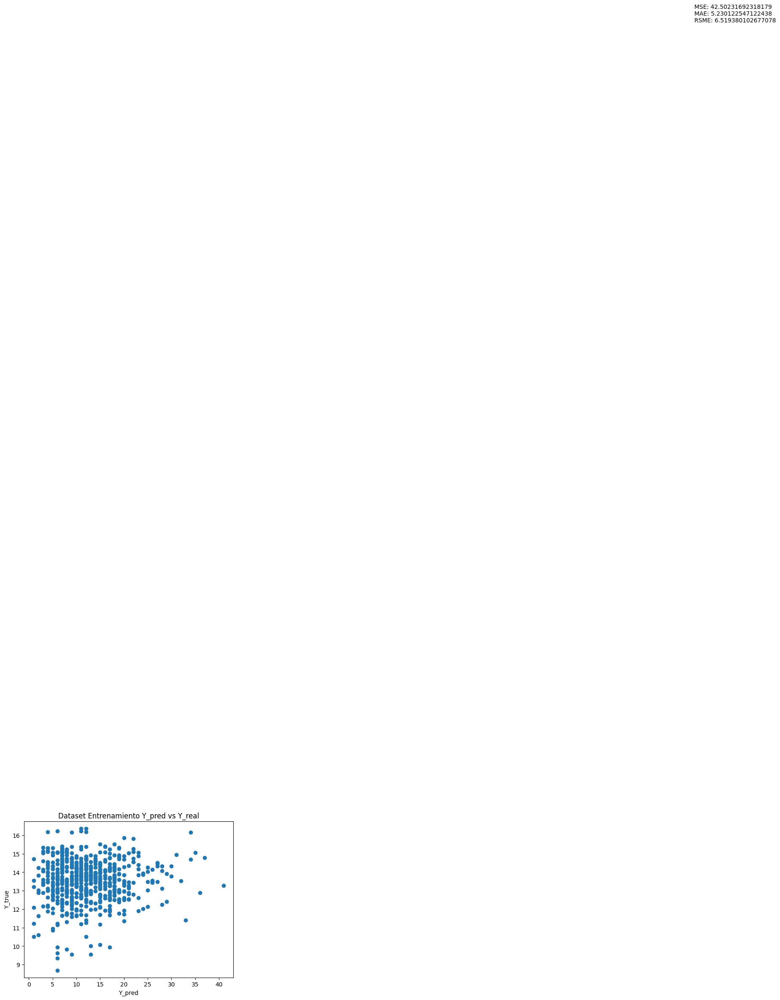

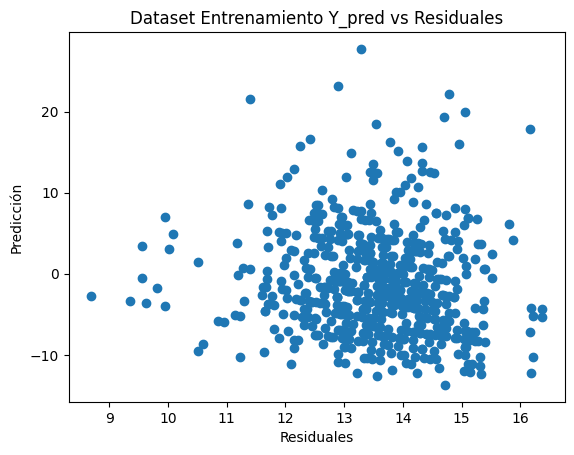

Graficas por mes

(42,) (42,)


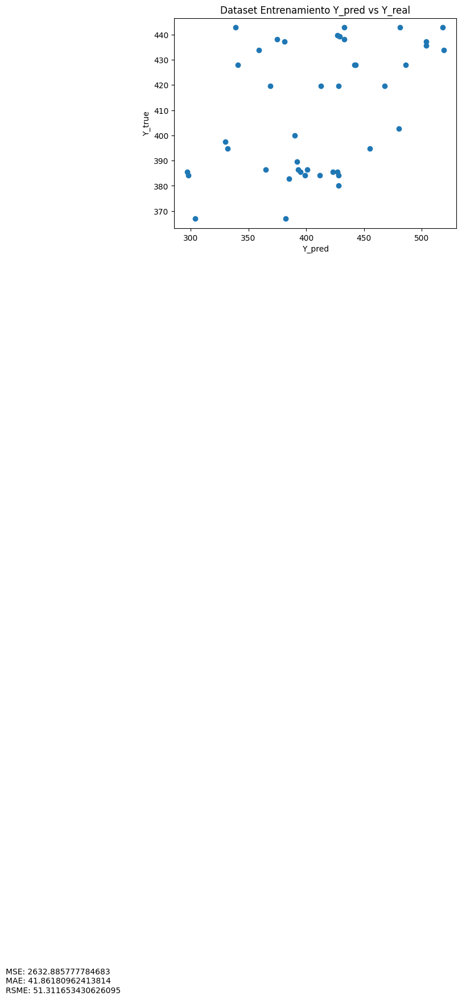

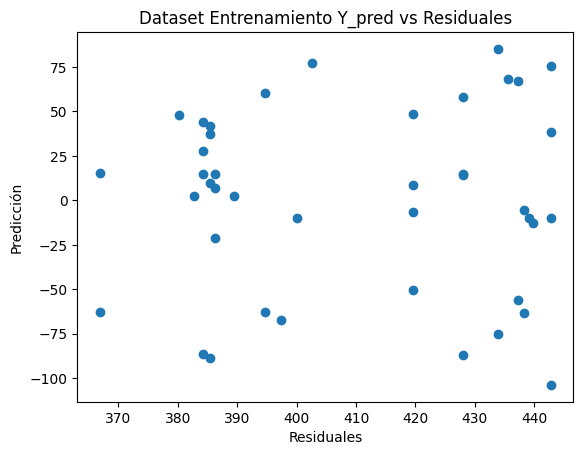


(20,) (20,)


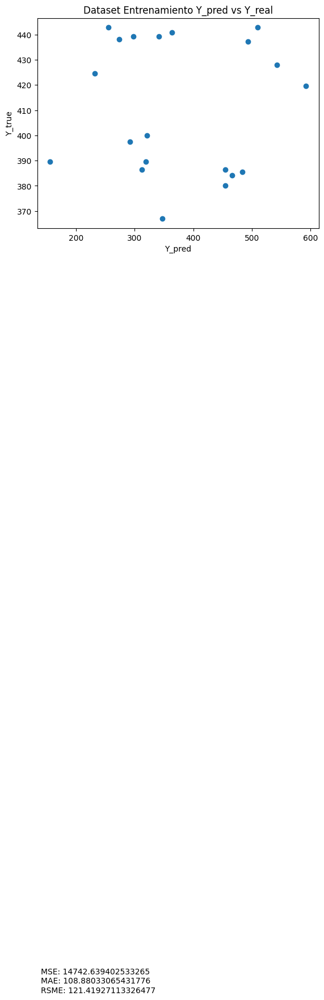

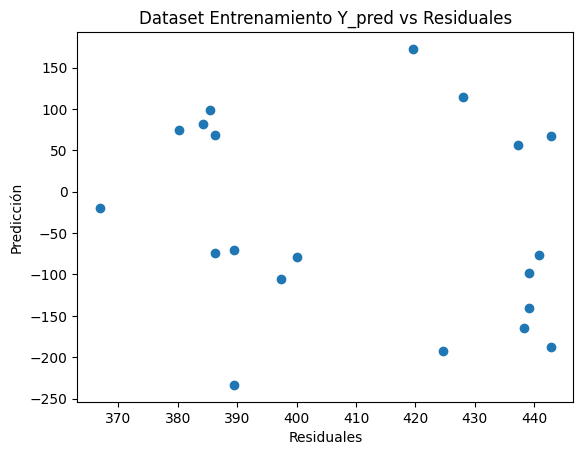

Graficas por semanal


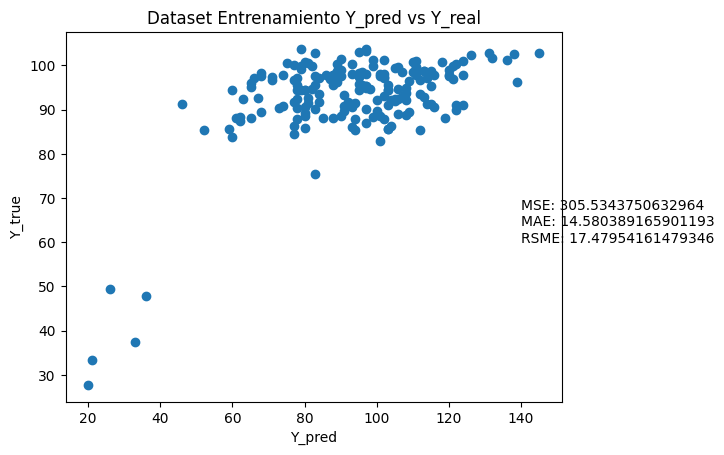

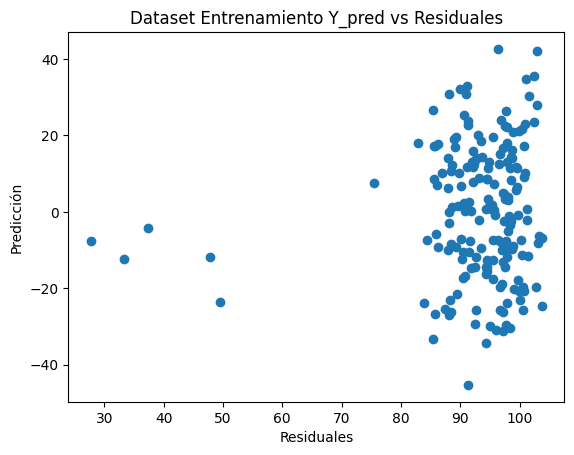

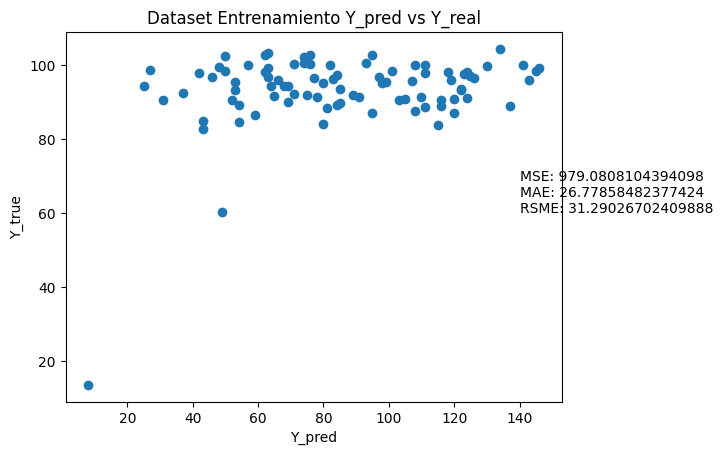

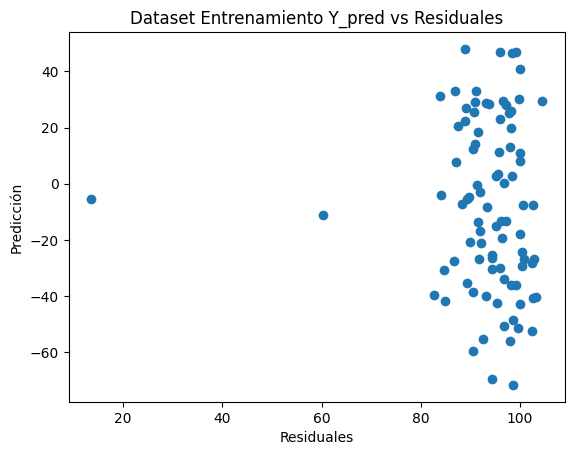

In [ ]:
get_all_values(type_accidents[2])

In [ ]:
get_all_values(type_accidents[3])

In [ ]:
get_all_values(type_accidents[4])

NameError: name 'get_all_values' is not defined

# Conclusiones 

Podemos decir que los agrupamientos de las comunas con nivel de accidentalidad (medio, alto y elevado) concuerdan con la realidad del municipio de Medellín, considerando sectores empresariales y comerciales, y las condiciones físicas de las vías.

Como observamos después del tratamiento respectivo a la fecha, el mes de agosto se puede observar que la accidentalidad es mucho más alta que en los demás meses

# Anexos

1. Link página web: https://tholes-medellin-accidentes-home-bq1o7x.streamlit.app/

undefined. Video promocional: https://youtu.be/0YYnhL1uv6g

# Referencias

- Incidentes viales. Recuperado el 26 de octubre de 2022. http://medata.gov.co/dataset/incidentes-viales

- Informe de calidad de vida de Medellín, 2018. Recuperado el 1 de noviembre de 2022. https://www.medellincomovamos.org/sites/default/files/2020-01/documentos/Documento%20-%20Informe%20de%20Calidad%20de%20Vida%20de%20Medell%C3%ADn%2C%202018.pdf

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=b5acebd3-b390-4f39-bf2e-0627dbe3473a' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>